# Preparation

##Clone Data from Github

In [4]:
#Clone data from github into colab inventory
!git clone https://github.com/andieveridea/DataSet.git

Cloning into 'DataSet'...
remote: Enumerating objects: 18, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 570 (delta 0), reused 18 (delta 0), pack-reused 552
Receiving objects: 100% (570/570), 56.73 MiB | 20.06 MiB/s, done.
Resolving deltas: 100% (3/3), done.


## Import Libraries

In [5]:
#Import important libraries
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.colors as pltc
import numpy as np
import cv2 as cv
import os
from tensorflow.keras.layers import Conv2D, Dense, MaxPooling2D, Flatten, Dropout, BatchNormalization
from sklearn.model_selection import train_test_split, StratifiedKFold
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm
from PIL import Image
import seaborn as sb
import pandas as pd
print("Done!")

Done!


## Some of Hyperparameters

In [6]:
image_size = 64
optimizer_function = 'Adam'
loss_function = 'sparse_categorical_crossentropy'
print("Done!")

Done!


## Load dataset

In [7]:
#Load dataset
data_complete_path = "/content/DataSet/" + "all_data"
data_train_path = "/content/DataSet/partial_data/" + "training"
data_validation_path = "/content/DataSet/partial_data/" + "validation"
data_test_path = "/content/DataSet/partial_data/" + "testing"

categories = ["buttercup", "pinkstripe", "sonia"]

def parsing_data_into_array(data_path):
  loaded_data = []
  for category in sorted(categories):
    path = os.path.join(data_path, category)
    category_index = categories.index(category)
    for data_image in tqdm(sorted(os.listdir(path))):
      try:
        array_image = cv.imread(os.path.join(path, data_image))
        RGB_image = cv.cvtColor(array_image, cv.COLOR_BGR2RGB)
        data_image = cv.resize(RGB_image, (image_size, image_size))
        loaded_data.append([data_image, category_index])
      except:
        print(error)

  return loaded_data

def split_data_n_label(data_set):
  x = []
  y = []
  for data_object, data_label in data_set:
    x.append(np.array(data_object/255.0))
    y.append(np.array(data_label))
  return [x, y]

data_complete = parsing_data_into_array(data_complete_path)
data_train = parsing_data_into_array(data_train_path)
data_validation = parsing_data_into_array(data_validation_path)
data_test = parsing_data_into_array(data_test_path)

x_data_complete, y_data_complete = split_data_n_label(data_complete)
x_data_train, y_data_train = split_data_n_label(data_train) 
x_data_validation, y_data_validation = split_data_n_label(data_validation)
x_data_test, y_data_test = split_data_n_label(data_test)

x_data_complete = np.array(x_data_complete).reshape(-1, image_size, image_size, 3)
y_data_complete = np.array(y_data_complete)
x_data_train = np.array(x_data_train).reshape(-1, image_size, image_size, 3)
y_data_train = np.array(y_data_train)
x_data_validation = np.array(x_data_validation).reshape(-1, image_size, image_size, 3)
y_data_validation = np.array(y_data_validation)
x_data_test = np.array(x_data_test).reshape(-1, image_size, image_size, 3)
y_data_test = np.array(y_data_test)
print("Done!")

100%|██████████| 27/27 [00:00<00:00, 293.36it/s]


Done!


In [8]:
folder_path = "/content/DataSet/" + "all_data"
categories = ["buttercup", "pinkstripe", "sonia"]
loaded_data_set = []

for category in sorted(categories):
    path = os.path.join(folder_path, category)
    class_index = categories.index(category)
    for data_image in tqdm(sorted(os.listdir(path))):
      try:
        image_array = cv.imread(os.path.join(path, data_image))
        image_RGB = cv.cvtColor(image_array, cv.COLOR_BGR2RGB)
        data_image = cv.resize(image_RGB, (image_size, image_size))
        loaded_data_set.append([data_image, class_index])
      except Exception as error:
        print(error)

x = []
y = []

for data_image, label in loaded_data_set:
  x.append(data_image)
  y.append(label)

#non augmentation data
x = np.array(x)/255.0
y = np.array(y)

print("\n")
print("Total data", len(x))

X_train, X_test, Y_train, Y_test = train_test_split(x, y, stratify=y, train_size = 0.85)

X_train = X_train
X_test = X_test

X_train2, X_validation, Y_train2, Y_validation = train_test_split(X_train, Y_train, stratify=Y_train, train_size = 0.825)
input_shape = x.shape[1:]

X_train3 = X_train2
Y_train3 = Y_train2
X_validation2 = X_validation
Y_validation2 = Y_validation

X_train3 = X_train3.astype('float32')
X_validation2 = X_validation2.astype('float32')

input_data = np.concatenate((X_train3, X_validation2), axis=0)
input_data_label = np.concatenate((Y_train3, Y_validation2), axis=0)
input_data_test = X_test

INPUT_V1 = [input_data, input_data_label, input_data_test, Y_test]
INPUT_V2 = [X_train3, Y_train3, X_test, Y_test, X_validation2, Y_validation]

input_data_0, input_data_label_0 = [x, y]
input_data_1, input_data_label_1, input_data_test_1, input_data_test_label_1 = INPUT_V1
input_data_2, input_data_label_2, input_data_test_2, input_data_test_label_2, input_data_val_2, input_data_val_label_2 = INPUT_V2

print("This Parameters For my old Research")
print("Data Train + Validation Format : ", input_data_label.shape)
print("Data Train Format : ", input_data.shape)
print("Data Test Format : ", input_data_test.shape)
print("")
print("This Parameters For my new Research")
print("Data Train : ", input_data_2.shape)
print("Data Validation : ", input_data_val_2.shape)
print("Data Test: ", input_data_test_2.shape)
print("")
print("")
print("This Original Data")
print("Data Set : ", input_data_0.shape)
print("")

100%|██████████| 180/180 [00:00<00:00, 280.81it/s]




Total data 540
This Parameters For my old Research
Data Train + Validation Format :  (459,)
Data Train Format :  (459, 64, 64, 3)
Data Test Format :  (81, 64, 64, 3)

This Parameters For my new Research
Data Train :  (378, 64, 64, 3)
Data Validation :  (81, 64, 64, 3)
Data Test:  (81, 64, 64, 3)


This Original Data
Data Set :  (540, 64, 64, 3)



## Functions #1

In [40]:
from random import sample
import statistics

def autolabel(rects, aax):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        aax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')
        
def result_train_models(model_losses, model_accurations, labels):
  y_pos1 = np.arange(len(labels))
  y_pos2 = np.arange(len(labels))
  all_colors = [k for k,v in pltc.cnames.items()]
  colors = sample(all_colors, len(model_losses))

  width = 0.35
  fig, ax = plt.subplots(1,2,figsize=(25,5))
  rects1 = ax[0].bar(y_pos1 + width/2, model_losses, width, color=colors)
  rects2 = ax[1].bar(y_pos2 + width/2, model_accurations, width, color=colors)
  ax[0].set_title('Model Loss Comparation')
  ax[0].set_ylim(top=25)
  ax[0].set_ylim(bottom=0)
  ax[0].set_xticks(y_pos2)
  ax[0].set_xticklabels(labels)
  ax[1].set_title('Model Acc Comparation')
  ax[1].set_ylim(top=105)
  ax[1].set_ylim(bottom=0)
  ax[1].set_xticks(y_pos2)
  ax[1].set_xticklabels(labels)
  autolabel(rects1, ax[0])
  autolabel(rects2, ax[1])
  plt.show()

def augmentation(d_input, d_input_label, augmentation_format):
  return augmentation_format.flow(d_input, d_input_label, shuffle=True)

def model_result_checker(d_history):
  fig, ax = plt.subplots(1,2,figsize=(10,3))
  ax[0].plot(d_history.history['loss'])
  ax[0].plot(d_history.history['val_loss'])
  #ax[0].set_title('Loss')
  ax[0].set_ylabel('Loss')
  ax[0].set_xlabel('Epoch')
  ax[0].legend(['train', 'val'], loc='upper right')

  ax[1].plot(d_history.history['accuracy'])
  ax[1].plot(d_history.history['val_accuracy'])
  #ax[1].set_title('Accuracy')
  ax[1].set_ylabel('Accuracy')
  ax[1].set_xlabel('Epoch')
  ax[1].set_ylim(top=1.3)
  ax[1].set_ylim(bottom=0)
  ax[1].legend(['train', 'val'], loc='upper right')

  plt.show()

def average_result(numbers):
  return statistics.mean(numbers)

def predict_multiple_data(d_model, d_test, y_test):
  total_correct = 0
  total_incorrect = 0
  for i in range(len(d_test)):
    testing_data = d_test[i]
    input_test = categories[y_test[i]]
    #print("Input Test : ", input_test)
    testing_data = testing_data.astype('float32')

    pred = d_model.predict(testing_data.reshape(1, image_size,image_size,3))
    class_id = np.argmax(pred)
    output_test = categories[class_id]

    #print("Output Test : ", output_test)

    if input_test == output_test :
      #print("Correct")
      total_correct = total_correct + 1
    else:
      #print("Incorrect")
      total_incorrect = total_incorrect + 1
      #print("\n")
    
  accuration = total_correct/len(d_test) * 100
  print("Total Data Test", len(d_test))
  print("Total Correct : ", total_correct)
  print("Total Incorrect : ", total_incorrect)
  print("--------------------------------------")
  print("Accuration : ", round(accuration, 2), "%")
  print("--------------------------------------")
  print("\n")
  yPred1 = d_model.predict(d_test)
  yPred2 = np.argmax(yPred1, axis=1)
  df = pd.DataFrame({'prediction' : yPred2, 'test':  y_test})
  print(classification_report(y_test, yPred2))
  print("==============================================================")
  return round(accuration, 2)

## Functions #2

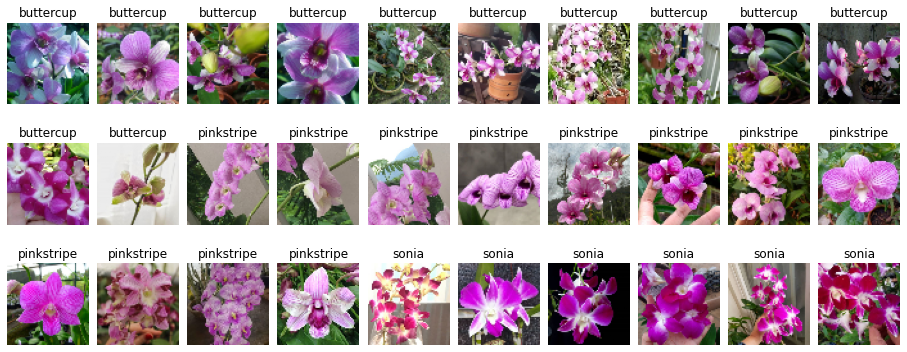

In [10]:
#Show dataset

font = {'family': 'sans',
        'color':  'darkred',
        'weight': 'normal',
        'size': 12,
        }

def show_data(x_data, y_data, baris, kolom):
  fig, ax = plt.subplots(baris,kolom,figsize=(16,6))
  fig.subplots_adjust(hspace=0.4, wspace=0.1)

  for x in range(0, baris):
    for i in range(0, kolom):
      ax[x, i].imshow(x_data[i+x*25], cmap='gray')
      ax[x, i].set_title(categories[y_data[i+x*25]])
      ax[x, i].axis('off')
  plt.show()

show_data(x_data_test, y_data_test, 3, 10)

def show_image_predictions(images, actual_label, pred_label):
  fig, ax = plt.subplots(9,10,figsize=(30,30))
  fig.subplots_adjust(hspace=0.1, wspace=0.1)
  for j in range(0,9):
      for i in range(0, 10):
        index = i+j*10
        if(index < len(images)):
          ax[j,i].imshow(images[index], cmap='gray')
          actual = categories[actual_label[index]]
          pred = categories[pred_label[index]]
          title = (actual + " => " + pred)
          if(actual != pred):
            ax[j,i].set_title(title, fontdict=font)
          else:
            ax[j,i].set_title(title)
          ax[j,i].axis('off')
  plt.show()

#show_image_predictions(x_data_test, y_data_test, y_data_test)

# Create Models

## Basis Model

### Model 1

In [11]:
#Model 1
model1 = Sequential()
model1.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(image_size, image_size, 3)))
model1.add(MaxPooling2D())

model1.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model1.add(MaxPooling2D())

model1.add(Flatten())

model1.add(Dense(256, activation='relu'))
model1.add(Dense(3, activation='softmax'))
model1.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 62, 62, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 31, 31, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 29, 29, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 14, 14, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 12544)             0         
_________________________________________________________________
dense (Dense)                (None, 256)               3211520   
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 7

###Model 2

In [12]:
#Model 2
model2 = Sequential()
model2.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(image_size, image_size, 3)))
model2.add(MaxPooling2D())

model2.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model2.add(MaxPooling2D())

model2.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model2.add(MaxPooling2D())

model2.add(Flatten())

model2.add(Dense(256, activation='relu'))
model2.add(Dense(3, activation='softmax'))
model2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 62, 62, 32)        896       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 31, 31, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 29, 29, 64)        18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 12, 12, 128)       73856     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 6, 6, 128)         0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 4608)             

###Model 3

In [13]:
#Model 3
model3 = Sequential()
model3.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(image_size, image_size, 3)))
model3.add(MaxPooling2D())

model3.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model3.add(MaxPooling2D())

model3.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model3.add(MaxPooling2D())

model3.add(Conv2D(256, kernel_size=(3, 3), activation='relu'))
model3.add(MaxPooling2D())

model3.add(Flatten())

model3.add(Dense(256, activation='relu'))
model3.add(Dense(3, activation='softmax'))
model3.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 62, 62, 32)        896       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 31, 31, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 29, 29, 64)        18496     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 12, 12, 128)       73856     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 6, 6, 128)         0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 4, 4, 256)        

## Model Dropout(0.5)

### Model 4

In [14]:
#Model 4
dropout4 = 0.5
model4 = Sequential()
model4.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(image_size, image_size, 3)))
model4.add(MaxPooling2D())
model4.add(Dropout(dropout4))

model4.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model4.add(MaxPooling2D())
model4.add(Dropout(dropout4))

model4.add(Flatten())

model4.add(Dense(256, activation='relu'))
model4.add(Dropout(dropout4))
model4.add(Dense(3, activation='softmax'))
model4.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 62, 62, 32)        896       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 31, 31, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 31, 31, 32)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 29, 29, 64)        18496     
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 14, 14, 64)        0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 12544)            

###Model 5

In [15]:
#Model 5
dropout5 = 0.5
model5 = Sequential()
model5.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(image_size, image_size, 3)))
model5.add(MaxPooling2D())
model5.add(Dropout(dropout5))

model5.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model5.add(MaxPooling2D())
model5.add(Dropout(dropout5))

model5.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model5.add(MaxPooling2D())
model5.add(Dropout(dropout5))

model5.add(Flatten())

model5.add(Dense(256, activation='relu'))
model5.add(Dropout(dropout5))
model5.add(Dense(3, activation='softmax'))
model5.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_11 (Conv2D)           (None, 62, 62, 32)        896       
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 31, 31, 32)        0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 31, 31, 32)        0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 29, 29, 64)        18496     
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 12, 12, 128)      

###Model 6

In [16]:
#Model 6
dropout6 = 0.5
model6 = Sequential()
model6.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(image_size, image_size, 3)))
model6.add(MaxPooling2D())
model6.add(Dropout(dropout6))

model6.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model6.add(MaxPooling2D())
model6.add(Dropout(dropout6))

model6.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model6.add(MaxPooling2D())
model6.add(Dropout(dropout6))

model6.add(Conv2D(256, kernel_size=(3, 3), activation='relu'))
model6.add(MaxPooling2D())
model6.add(Dropout(dropout6))

model6.add(Flatten())

model6.add(Dense(256, activation='relu'))
model6.add(Dropout(dropout6))
model6.add(Dense(3, activation='softmax'))
model6.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_14 (Conv2D)           (None, 62, 62, 32)        896       
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 31, 31, 32)        0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 31, 31, 32)        0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 29, 29, 64)        18496     
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 12, 12, 128)      

##Model Dropout(0.25)

###Model 7

In [17]:
#Model 7
dropout7 = 0.25
model7 = Sequential()
model7.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(image_size, image_size, 3)))
model7.add(MaxPooling2D())
model7.add(Dropout(dropout7))

model7.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model7.add(MaxPooling2D())
model7.add(Dropout(dropout7))

model7.add(Flatten())

model7.add(Dense(256, activation='relu'))
model7.add(Dropout(dropout7))
model7.add(Dense(3, activation='softmax'))
model7.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_18 (Conv2D)           (None, 62, 62, 32)        896       
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 31, 31, 32)        0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 31, 31, 32)        0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 29, 29, 64)        18496     
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 14, 14, 64)        0         
_________________________________________________________________
flatten_6 (Flatten)          (None, 12544)            

###Model 8

In [18]:
#Model 8
dropout8 = 0.25
model8 = Sequential()
model8.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(image_size, image_size, 3)))
model8.add(MaxPooling2D())
model8.add(Dropout(dropout8))

model8.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model8.add(MaxPooling2D())
model8.add(Dropout(dropout8))

model8.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model8.add(MaxPooling2D())
model8.add(Dropout(dropout8))

model8.add(Flatten())

model8.add(Dense(256, activation='relu'))
model8.add(Dropout(dropout8))
model8.add(Dense(3, activation='softmax'))
model8.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (None, 62, 62, 32)        896       
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 31, 31, 32)        0         
_________________________________________________________________
dropout_15 (Dropout)         (None, 31, 31, 32)        0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 29, 29, 64)        18496     
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 12, 12, 128)      

###Model 9

In [19]:
#Model 9
dropout9 = 0.25
model9 = Sequential()
model9.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(image_size, image_size, 3)))
model9.add(MaxPooling2D())
model9.add(Dropout(dropout9))

model9.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model9.add(MaxPooling2D())
model9.add(Dropout(dropout9))

model9.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model9.add(MaxPooling2D())
model9.add(Dropout(dropout9))

model9.add(Conv2D(256, kernel_size=(3, 3), activation='relu'))
model9.add(MaxPooling2D())
model9.add(Dropout(dropout9))

model9.add(Flatten())

model9.add(Dense(256, activation='relu'))
model9.add(Dropout(dropout9))
model9.add(Dense(3, activation='softmax'))
model9.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_23 (Conv2D)           (None, 62, 62, 32)        896       
_________________________________________________________________
max_pooling2d_23 (MaxPooling (None, 31, 31, 32)        0         
_________________________________________________________________
dropout_19 (Dropout)         (None, 31, 31, 32)        0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 29, 29, 64)        18496     
_________________________________________________________________
max_pooling2d_24 (MaxPooling (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 12, 12, 128)      

# Train Model

## Configurate Data Augmentation

In [20]:
aug_generator = ImageDataGenerator(horizontal_flip = True,
                                   vertical_flip = True,
                                   rotation_range = 45)

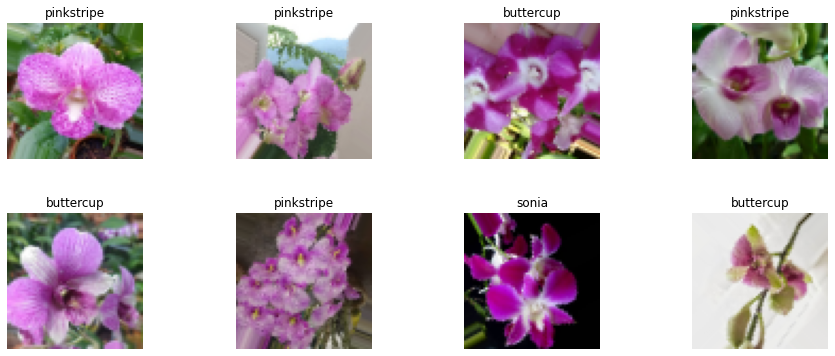

In [15]:
#Contoh data setelah diaugmentasi


data = augmentation(x_data_test, y_data_test, aug_generator)
show_data(data[0][0],data[0][1], 2, 4)

##Configurate epochs and batch_size

In [18]:
epochs = 20
batch_size = 10

## Single Train (No Data Augmentation)

###Model 1

Epoch 1/50
24/24 [==============================] - 0s 16ms/step - loss: 1.0527 - accuracy: 0.5000 - val_loss: 0.9077 - val_accuracy: 0.5679 - lr: 0.0010
Epoch 2/50
24/24 [==============================] - 0s 10ms/step - loss: 0.7680 - accuracy: 0.6825 - val_loss: 0.9494 - val_accuracy: 0.5926 - lr: 0.0010
Epoch 3/50
24/24 [==============================] - 0s 11ms/step - loss: 0.5803 - accuracy: 0.7725 - val_loss: 0.4798 - val_accuracy: 0.8395 - lr: 0.0010
Epoch 4/50
22/24 [==========================>...] - ETA: 0s - loss: 0.3794 - accuracy: 0.8523
Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
24/24 [==============================] - 0s 10ms/step - loss: 0.3977 - accuracy: 0.8466 - val_loss: 0.5668 - val_accuracy: 0.7160 - lr: 0.0010
Epoch 5/50
24/24 [==============================] - 0s 10ms/step - loss: 0.2761 - accuracy: 0.9206 - val_loss: 0.4152 - val_accuracy: 0.8519 - lr: 1.0000e-04
Epoch 6/50
22/24 [==========================>...] - ETA: 0s - 

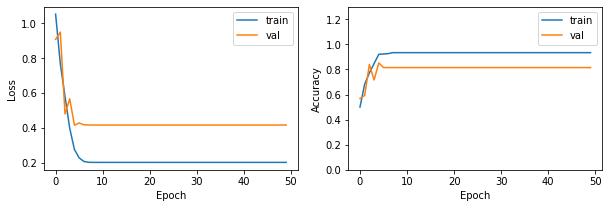

              precision    recall  f1-score   support

           0       0.80      0.89      0.84        27
           1       0.82      0.67      0.73        27
           2       0.86      0.93      0.89        27

    accuracy                           0.83        81
   macro avg       0.83      0.83      0.82        81
weighted avg       0.83      0.83      0.82        81



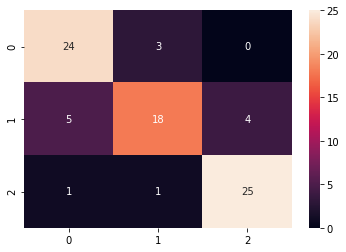

In [68]:
epoch_train = 50
batch_size_train = 16

red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.1)

model1.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model1.fit(input_data_2, input_data_label_2, 
                 batch_size= batch_size_train,
                 epochs= epoch_train,
                 verbose= 1,
                 validation_data= (input_data_val_2, input_data_val_label_2)
                 ,callbacks=[red_lr]
                 )
lose, acc = model1.evaluate(input_data_val_2, input_data_val_label_2, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

yPred1 = model1.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
df = pd.DataFrame({'prediction' : yPred2, 'test':  input_data_test_label_2})
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2))
sb.heatmap(cm, annot=True, fmt='d')

Epoch 1/20
38/38 [==============================] - 1s 39ms/step - loss: 1.1035 - accuracy: 0.3598 - val_loss: 0.9824 - val_accuracy: 0.5185 - lr: 0.0010
Epoch 2/20
38/38 [==============================] - 1s 31ms/step - loss: 1.1057 - accuracy: 0.3201 - val_loss: 1.0986 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 3/20
38/38 [==============================] - 1s 32ms/step - loss: 1.0990 - accuracy: 0.3333 - val_loss: 1.0986 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 4/20
38/38 [==============================] - 1s 31ms/step - loss: 1.0990 - accuracy: 0.3095 - val_loss: 1.0986 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 5/20
38/38 [==============================] - 1s 31ms/step - loss: 1.0989 - accuracy: 0.3175 - val_loss: 1.0986 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 6/20
37/38 [============================>.] - ETA: 0s - loss: 1.0990 - accuracy: 0.3541
Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
38/38 [==============================] - 1s 31ms/step - 

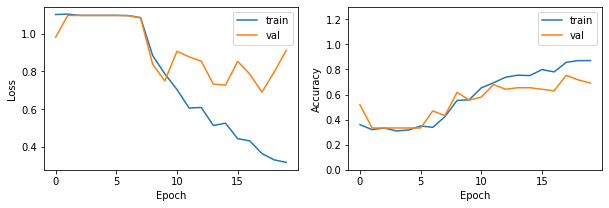

In [45]:
red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=5,verbose=1,factor=0.4)

model1.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model1.fit(x_data_train, y_data_train, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= (x_data_validation, y_data_validation)
                 ,callbacks=[red_lr]
                 )
lose, acc = model1.evaluate(x_data_test, y_data_test, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

###Model 2

In [1]:
epoch_train = 50
batch_size_train = 16

red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.1)

model2.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model2.fit(input_data_2, input_data_label_2, 
                 batch_size= batch_size_train,
                 epochs= epoch_train,
                 verbose= 1,
                 validation_data= (input_data_val_2, input_data_val_label_2)
                 ,callbacks=[red_lr]
                 )
lose, acc = model2.evaluate(input_data_val_2, input_data_val_label_2, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

yPred1 = model2.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
df = pd.DataFrame({'prediction' : yPred2, 'test':  input_data_test_label_2})
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2))
sb.heatmap(cm, annot=True, fmt='d')

NameError: ignored

###Model 3

Epoch 1/100
24/24 [==============================] - 0s 20ms/step - loss: 0.4800 - accuracy: 0.8201 - val_loss: 0.7674 - val_accuracy: 0.6543 - lr: 0.0010
Epoch 2/100
24/24 [==============================] - 0s 13ms/step - loss: 0.2870 - accuracy: 0.8889 - val_loss: 0.9723 - val_accuracy: 0.6667 - lr: 0.0010
Epoch 3/100
24/24 [==============================] - 0s 13ms/step - loss: 0.2957 - accuracy: 0.8810 - val_loss: 0.6274 - val_accuracy: 0.7284 - lr: 0.0010
Epoch 4/100
22/24 [==========================>...] - ETA: 0s - loss: 0.2268 - accuracy: 0.9261
Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
24/24 [==============================] - 0s 13ms/step - loss: 0.2369 - accuracy: 0.9206 - val_loss: 0.9346 - val_accuracy: 0.6790 - lr: 0.0010
Epoch 5/100
22/24 [==========================>...] - ETA: 0s - loss: 0.1590 - accuracy: 0.9460
Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
24/24 [==============================] - 0

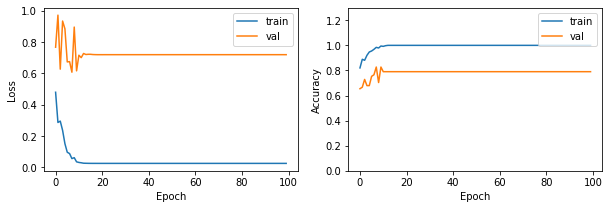

              precision    recall  f1-score   support

           0       0.64      0.85      0.73        27
           1       0.78      0.78      0.78        27
           2       0.94      0.63      0.76        27

    accuracy                           0.75        81
   macro avg       0.79      0.75      0.75        81
weighted avg       0.79      0.75      0.75        81



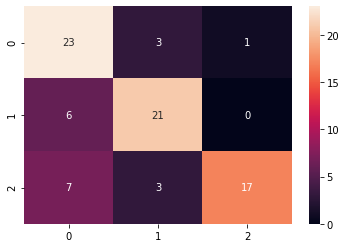

In [51]:
epoch_train = 100
batch_size_train = 16

red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.5)

model3.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model3.fit(x_data_train, y_data_train, 
                 batch_size= batch_size_train,
                 epochs= epoch_train,
                 verbose= 1,
                 validation_data= (x_data_validation, y_data_validation)
                 ,callbacks=[red_lr]
                 )
lose, acc = model3.evaluate(x_data_test, y_data_test, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

yPred1 = model3.predict(x_data_test)
yPred2 = np.argmax(yPred1,axis=1)
df = pd.DataFrame({'prediction' : yPred2, 'test':  y_data_test})
cm = confusion_matrix(y_data_test, yPred2)
print(classification_report(y_data_test, yPred2))
sb.heatmap(cm, annot=True, fmt='d')

Epoch 1/20
38/38 [==============================] - 1s 23ms/step - loss: 1.1132 - accuracy: 0.3386 - val_loss: 1.0997 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 2/20
38/38 [==============================] - 0s 12ms/step - loss: 0.9859 - accuracy: 0.5238 - val_loss: 1.1191 - val_accuracy: 0.5185 - lr: 0.0010
Epoch 3/20
38/38 [==============================] - 0s 12ms/step - loss: 0.6603 - accuracy: 0.7434 - val_loss: 0.6755 - val_accuracy: 0.6790 - lr: 0.0010
Epoch 4/20
38/38 [==============================] - ETA: 0s - loss: 0.4207 - accuracy: 0.8307
Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
38/38 [==============================] - 0s 12ms/step - loss: 0.4207 - accuracy: 0.8307 - val_loss: 0.6982 - val_accuracy: 0.6049 - lr: 0.0010
Epoch 5/20
38/38 [==============================] - 0s 12ms/step - loss: 0.3346 - accuracy: 0.8704 - val_loss: 0.6704 - val_accuracy: 0.7160 - lr: 1.0000e-04
Epoch 6/20
37/38 [============================>.] - ETA: 0s - 

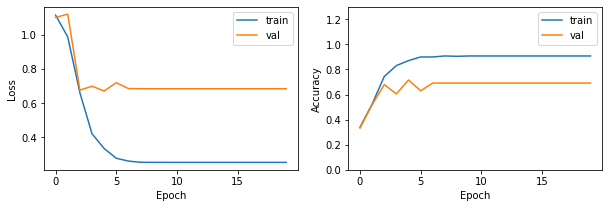

In [41]:
red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.1)

model3.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model3.fit(x_data_train, y_data_train, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= (x_data_validation, y_data_validation)
                 ,callbacks=[red_lr]
                 )
lose, acc = model3.evaluate(x_data_test, y_data_test, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

###Model 4 (Dropout 0.5)

Epoch 1/20
38/38 [==============================] - 2s 40ms/step - loss: 0.5537 - accuracy: 0.7725 - val_loss: 1.0282 - val_accuracy: 0.5185 - lr: 0.0010
Epoch 2/20
37/38 [============================>.] - ETA: 0s - loss: 0.3816 - accuracy: 0.8351
Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
38/38 [==============================] - 1s 33ms/step - loss: 0.3789 - accuracy: 0.8360 - val_loss: 1.3602 - val_accuracy: 0.4938 - lr: 0.0010
Epoch 3/20
37/38 [============================>.] - ETA: 0s - loss: 0.3703 - accuracy: 0.8216
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
38/38 [==============================] - 1s 33ms/step - loss: 0.3699 - accuracy: 0.8228 - val_loss: 1.2848 - val_accuracy: 0.4815 - lr: 5.0000e-04
Epoch 4/20
38/38 [==============================] - 1s 32ms/step - loss: 0.3235 - accuracy: 0.8704 - val_loss: 1.4116 - val_accuracy: 0.5309 - lr: 2.5000e-04
Epoch 5/20
37/38 [============================>.] 

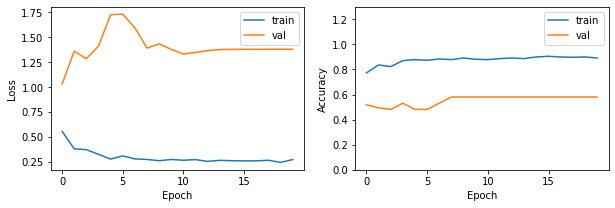

In [43]:
red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.5)

model4.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model4.fit(x_data_train, y_data_train, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= (x_data_validation, y_data_validation)
                 ,callbacks=[red_lr]
                 )
lose, acc = model4.evaluate(x_data_test, y_data_test, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

###Model 5 (Dropout 0.5)

Epoch 1/20
38/38 [==============================] - 1s 28ms/step - loss: 0.5409 - accuracy: 0.7831 - val_loss: 0.6975 - val_accuracy: 0.6543 - lr: 0.0010
Epoch 2/20
38/38 [==============================] - 1s 21ms/step - loss: 0.4616 - accuracy: 0.8571 - val_loss: 0.5703 - val_accuracy: 0.7778 - lr: 0.0010
Epoch 3/20
37/38 [============================>.] - ETA: 0s - loss: 0.4386 - accuracy: 0.8432
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
38/38 [==============================] - 1s 22ms/step - loss: 0.4405 - accuracy: 0.8413 - val_loss: 0.6821 - val_accuracy: 0.7407 - lr: 0.0010
Epoch 4/20
37/38 [============================>.] - ETA: 0s - loss: 0.3573 - accuracy: 0.8757
Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
38/38 [==============================] - 1s 21ms/step - loss: 0.3539 - accuracy: 0.8783 - val_loss: 0.6326 - val_accuracy: 0.6914 - lr: 5.0000e-04
Epoch 5/20
37/38 [============================>.] - ET

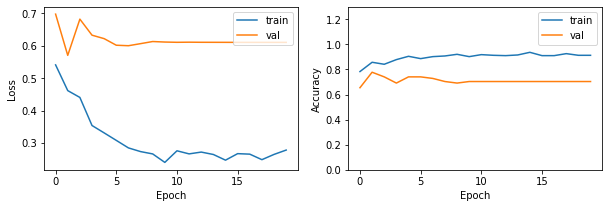

In [49]:
red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.5)

model5.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model5.fit(x_data_train, y_data_train, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= (x_data_validation, y_data_validation)
                 ,callbacks=[red_lr]
                 )
lose, acc = model5.evaluate(x_data_test, y_data_test, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

###Model 6 (Dropout 0.5)

Epoch 1/20
38/38 [==============================] - 1s 21ms/step - loss: 0.7380 - accuracy: 0.6323 - val_loss: 0.7408 - val_accuracy: 0.5802 - lr: 0.0010
Epoch 2/20
35/38 [==========================>...] - ETA: 0s - loss: 0.6747 - accuracy: 0.6629
Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
38/38 [==============================] - 1s 15ms/step - loss: 0.6631 - accuracy: 0.6693 - val_loss: 0.8680 - val_accuracy: 0.5432 - lr: 0.0010
Epoch 3/20
37/38 [============================>.] - ETA: 0s - loss: 0.6284 - accuracy: 0.6919
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
38/38 [==============================] - 1s 14ms/step - loss: 0.6274 - accuracy: 0.6931 - val_loss: 0.8739 - val_accuracy: 0.5432 - lr: 5.0000e-04
Epoch 4/20
36/38 [===========================>..] - ETA: 0s - loss: 0.6124 - accuracy: 0.6972
Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
38/38 [===========================

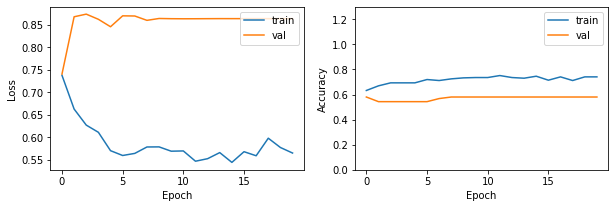

In [52]:
red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.5)

model6.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model6.fit(x_data_train, y_data_train, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= (x_data_validation, y_data_validation)
                 ,callbacks=[red_lr]
                 )
lose, acc = model6.evaluate(x_data_test, y_data_test, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

###Model 7 (Dropout 0.25)

Epoch 1/20
38/38 [==============================] - 1s 36ms/step - loss: 1.1013 - accuracy: 0.2698 - val_loss: 1.0986 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 2/20
37/38 [============================>.] - ETA: 0s - loss: 1.0992 - accuracy: 0.3243
Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
38/38 [==============================] - 1s 33ms/step - loss: 1.0995 - accuracy: 0.3175 - val_loss: 1.0987 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 3/20
38/38 [==============================] - 1s 33ms/step - loss: 1.0977 - accuracy: 0.3333 - val_loss: 1.0912 - val_accuracy: 0.3827 - lr: 5.0000e-04
Epoch 4/20
38/38 [==============================] - 1s 33ms/step - loss: 0.9258 - accuracy: 0.5370 - val_loss: 0.9519 - val_accuracy: 0.5062 - lr: 5.0000e-04
Epoch 5/20
38/38 [==============================] - 1s 33ms/step - loss: 0.8268 - accuracy: 0.6455 - val_loss: 0.8468 - val_accuracy: 0.5679 - lr: 5.0000e-04
Epoch 6/20
38/38 [==============================] - 1s 

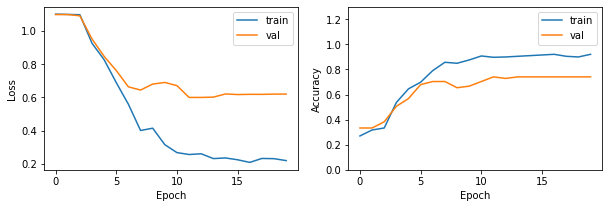

In [55]:
red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.5)

model7.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model7.fit(x_data_train, y_data_train, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= (x_data_validation, y_data_validation)
                 ,callbacks=[red_lr]
                 )
lose, acc = model7.evaluate(x_data_test, y_data_test, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

###Model 8 (Dropout 0.25)

Epoch 1/20
38/38 [==============================] - 1s 27ms/step - loss: 1.1930 - accuracy: 0.3571 - val_loss: 1.0985 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 2/20
38/38 [==============================] - 1s 21ms/step - loss: 1.0997 - accuracy: 0.3122 - val_loss: 1.0984 - val_accuracy: 0.3580 - lr: 0.0010
Epoch 3/20
37/38 [============================>.] - ETA: 0s - loss: 1.0979 - accuracy: 0.3216
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
38/38 [==============================] - 1s 21ms/step - loss: 1.0976 - accuracy: 0.3280 - val_loss: 1.0976 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 4/20
38/38 [==============================] - 1s 21ms/step - loss: 1.0617 - accuracy: 0.4550 - val_loss: 1.0542 - val_accuracy: 0.4938 - lr: 5.0000e-04
Epoch 5/20
38/38 [==============================] - 1s 21ms/step - loss: 0.8629 - accuracy: 0.6481 - val_loss: 0.9227 - val_accuracy: 0.5802 - lr: 5.0000e-04
Epoch 6/20
37/38 [============================>.] - ETA: 0s

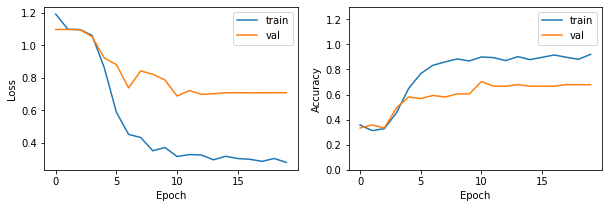

In [56]:
red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.5)

model8.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model8.fit(x_data_train, y_data_train, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= (x_data_validation, y_data_validation)
                 ,callbacks=[red_lr]
                 )
lose, acc = model8.evaluate(x_data_test, y_data_test, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

###Model 9 (Dropout 0.25)

Epoch 1/20
38/38 [==============================] - 1s 21ms/step - loss: 0.5648 - accuracy: 0.8016 - val_loss: 0.7513 - val_accuracy: 0.6296 - lr: 0.0010
Epoch 2/20
38/38 [==============================] - 1s 15ms/step - loss: 0.4021 - accuracy: 0.8519 - val_loss: 0.6692 - val_accuracy: 0.6543 - lr: 0.0010
Epoch 3/20
34/38 [=========================>....] - ETA: 0s - loss: 0.4314 - accuracy: 0.8235
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
38/38 [==============================] - 1s 14ms/step - loss: 0.4300 - accuracy: 0.8307 - val_loss: 0.8650 - val_accuracy: 0.5679 - lr: 0.0010
Epoch 4/20
38/38 [==============================] - 1s 15ms/step - loss: 0.3169 - accuracy: 0.8571 - val_loss: 0.5473 - val_accuracy: 0.7531 - lr: 5.0000e-04
Epoch 5/20
38/38 [==============================] - ETA: 0s - loss: 0.2746 - accuracy: 0.8968
Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
38/38 [==============================] - 1s

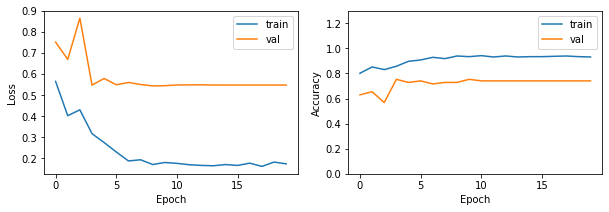

In [58]:
red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.5)

model9.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model9.fit(x_data_train, y_data_train, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= (x_data_validation, y_data_validation)
                 ,callbacks=[red_lr]
                 )
lose, acc = model9.evaluate(x_data_test, y_data_test, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

##Single Train (Data Augmentation)

###Model 1

Epoch 1/50
12/12 [==============================] - 1s 66ms/step - loss: 0.5078 - accuracy: 0.7857 - val_loss: 0.4494 - val_accuracy: 0.8272
Epoch 2/50
12/12 [==============================] - 1s 61ms/step - loss: 0.3798 - accuracy: 0.8439 - val_loss: 0.4456 - val_accuracy: 0.8395
Epoch 3/50
12/12 [==============================] - 1s 58ms/step - loss: 0.3365 - accuracy: 0.8624 - val_loss: 0.3296 - val_accuracy: 0.9012
Epoch 4/50
12/12 [==============================] - 1s 58ms/step - loss: 0.3825 - accuracy: 0.8413 - val_loss: 0.6287 - val_accuracy: 0.7654
Epoch 5/50
12/12 [==============================] - 1s 57ms/step - loss: 0.4321 - accuracy: 0.8148 - val_loss: 0.3988 - val_accuracy: 0.8642
Epoch 6/50
12/12 [==============================] - 1s 58ms/step - loss: 0.3678 - accuracy: 0.8545 - val_loss: 0.4319 - val_accuracy: 0.8395
Epoch 7/50
12/12 [==============================] - 1s 58ms/step - loss: 0.3667 - accuracy: 0.8624 - val_loss: 0.4824 - val_accuracy: 0.8395
Epoch 8/50
12

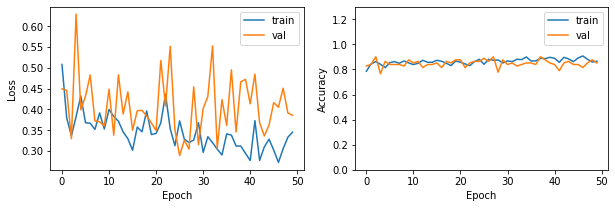

              precision    recall  f1-score   support

           0       0.32      0.30      0.31        27
           1       0.25      0.26      0.25        27
           2       0.39      0.41      0.40        27

    accuracy                           0.32        81
   macro avg       0.32      0.32      0.32        81
weighted avg       0.32      0.32      0.32        81



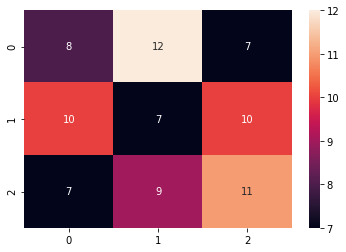

In [75]:
data_train_augmanted = augmentation(input_data_2, input_data_label_2, aug_generator)
data_validation_augmanted = augmentation(input_data_val_2, input_data_val_label_2, aug_generator)
data_test_augmanted = augmentation(input_data_test_2, input_data_test_label_2, aug_generator)

epoch_train = 50
batch_size_train = 10

red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.1)

model1.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model1.fit(data_train_augmanted, 
                 batch_size= batch_size_train,
                 epochs= epoch_train,
                 verbose= 1,
                 validation_data= data_validation_augmanted
                 #,callbacks=[red_lr]
                 )
lose, acc = model1.evaluate(data_validation_augmanted, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

yPred1 = model1.predict(data_test_augmanted)
yPred2 = np.argmax(yPred1,axis=1)
df = pd.DataFrame({'prediction' : yPred2, 'test':  input_data_test_label_2})
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2))
sb.heatmap(cm, annot=True, fmt='d')

Epoch 1/20
38/38 [==============================] - 3s 74ms/step - loss: 0.6974 - accuracy: 0.6984 - val_loss: 0.8041 - val_accuracy: 0.7407 - lr: 0.0010
Epoch 2/20
38/38 [==============================] - ETA: 0s - loss: 0.6346 - accuracy: 0.8016
Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
38/38 [==============================] - 3s 69ms/step - loss: 0.6346 - accuracy: 0.8016 - val_loss: 0.8886 - val_accuracy: 0.5679 - lr: 0.0010
Epoch 3/20
38/38 [==============================] - ETA: 0s - loss: 0.4598 - accuracy: 0.8228
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
38/38 [==============================] - 3s 70ms/step - loss: 0.4598 - accuracy: 0.8228 - val_loss: 0.6414 - val_accuracy: 0.7160 - lr: 5.0000e-04
Epoch 4/20
38/38 [==============================] - ETA: 0s - loss: 0.4157 - accuracy: 0.8466
Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
38/38 [===========================

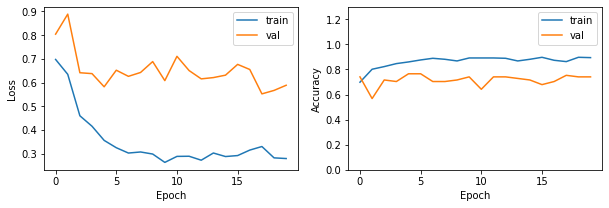

In [46]:
data_train_augmanted = augmentation(x_data_train, y_data_train, aug_generator, batch_size)
data_validation_augmanted = augmentation(x_data_validation, y_data_validation, aug_generator, batch_size)
data_test_augmanted = augmentation(x_data_test, y_data_test, aug_generator, batch_size)

red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.5)
model1.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model1.fit(data_train_augmanted, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= data_validation_augmanted
                 ,callbacks=[red_lr]
                 )
lose, acc = model1.evaluate(x_data_test, y_data_test, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

###Model 2

Epoch 1/100
11/11 [==============================] - 1s 73ms/step - loss: 1.0909 - accuracy: 0.4048 - val_loss: 1.0655 - val_accuracy: 0.3704 - lr: 0.0010
Epoch 2/100
11/11 [==============================] - 1s 64ms/step - loss: 0.9851 - accuracy: 0.4762 - val_loss: 0.9406 - val_accuracy: 0.6173 - lr: 0.0010
Epoch 3/100
11/11 [==============================] - 1s 61ms/step - loss: 0.7467 - accuracy: 0.6693 - val_loss: 0.9713 - val_accuracy: 0.5679 - lr: 0.0010
Epoch 4/100
11/11 [==============================] - 1s 60ms/step - loss: 0.7282 - accuracy: 0.6878 - val_loss: 1.2133 - val_accuracy: 0.4691 - lr: 0.0010
Epoch 5/100
11/11 [==============================] - 1s 64ms/step - loss: 0.6016 - accuracy: 0.7513 - val_loss: 0.9505 - val_accuracy: 0.5802 - lr: 0.0010
Epoch 6/100
11/11 [==============================] - 1s 66ms/step - loss: 0.4918 - accuracy: 0.8122 - val_loss: 0.8582 - val_accuracy: 0.6049 - lr: 0.0010
Epoch 7/100
11/11 [==============================] - 1s 63ms/step - lo

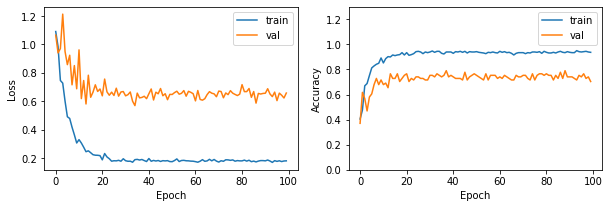

              precision    recall  f1-score   support

           0       0.69      0.89      0.77        27
           1       0.90      0.70      0.79        27
           2       0.88      0.81      0.85        27

    accuracy                           0.80        81
   macro avg       0.82      0.80      0.80        81
weighted avg       0.82      0.80      0.80        81



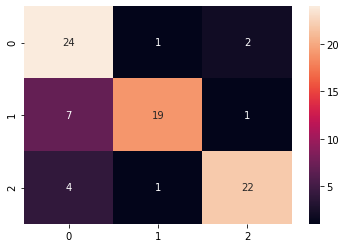

In [42]:
data_train_augmanted = augmentation(x_data_train, y_data_train, aug_generator, 35)
data_validation_augmanted = augmentation(x_data_validation, y_data_validation, aug_generator, 35)
data_test_augmanted = augmentation(x_data_test, y_data_test, aug_generator, 35)

epoch_train = 100
batch_size_train = 16

red_lr= ReduceLROnPlateau(monitor='loss',patience=1,verbose=1,factor=0.4)

model2.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model2.fit(data_train_augmanted, 
                 batch_size= batch_size_train,
                 epochs= epoch_train,
                 verbose= 1,
                 validation_data= data_validation_augmanted
                 ,callbacks=[red_lr]
                 )
lose, acc = model2.evaluate(x_data_test, y_data_test, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

yPred1 = model2.predict(x_data_test)
yPred2 = np.argmax(yPred1,axis=1)
df = pd.DataFrame({'prediction' : yPred2, 'test':  y_data_test})
cm = confusion_matrix(y_data_test, yPred2)
print(classification_report(y_data_test, yPred2))
sb.heatmap(cm, annot=True, fmt='d')

###Model 3

Epoch 1/20
38/38 [==============================] - 2s 58ms/step - loss: 0.4546 - accuracy: 0.7989 - val_loss: 0.6197 - val_accuracy: 0.7037 - lr: 0.0010
Epoch 2/20
38/38 [==============================] - 2s 54ms/step - loss: 0.3585 - accuracy: 0.8783 - val_loss: 0.4730 - val_accuracy: 0.7778 - lr: 0.0010
Epoch 3/20
38/38 [==============================] - 2s 55ms/step - loss: 0.3457 - accuracy: 0.8757 - val_loss: 0.4610 - val_accuracy: 0.7901 - lr: 0.0010
Epoch 4/20
37/38 [============================>.] - ETA: 0s - loss: 0.4297 - accuracy: 0.8234
Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
38/38 [==============================] - 2s 55ms/step - loss: 0.4270 - accuracy: 0.8228 - val_loss: 0.8229 - val_accuracy: 0.6049 - lr: 0.0010
Epoch 5/20
38/38 [==============================] - 2s 55ms/step - loss: 0.2561 - accuracy: 0.9101 - val_loss: 0.5197 - val_accuracy: 0.8148 - lr: 4.0000e-04
Epoch 6/20
37/38 [============================>.] - ETA: 0s - l

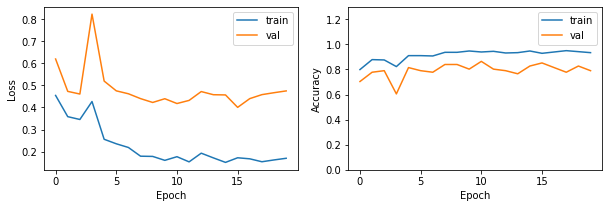

In [194]:
data_train_augmanted = augmentation(x_data_train, y_data_train, aug_generator, batch_size)
data_validation_augmanted = augmentation(x_data_validation, y_data_validation, aug_generator, batch_size)
data_test_augmanted = augmentation(x_data_test, y_data_test, aug_generator, batch_size)

red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.4)
model3.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model3.fit(data_train_augmanted, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= data_validation_augmanted
                 ,callbacks=[red_lr]
                 )
lose, acc = model3.evaluate(data_test_augmanted, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

Epoch 1/20
38/38 [==============================] - 2s 62ms/step - loss: 0.4484 - accuracy: 0.8333 - val_loss: 0.5480 - val_accuracy: 0.7531 - lr: 0.0010
Epoch 2/20
37/38 [============================>.] - ETA: 0s - loss: 0.3941 - accuracy: 0.8595
Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
38/38 [==============================] - 2s 58ms/step - loss: 0.3905 - accuracy: 0.8598 - val_loss: 0.6551 - val_accuracy: 0.6914 - lr: 0.0010
Epoch 3/20
37/38 [============================>.] - ETA: 0s - loss: 0.3477 - accuracy: 0.8641
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.00016000000759959222.
38/38 [==============================] - 2s 59ms/step - loss: 0.3445 - accuracy: 0.8677 - val_loss: 0.8442 - val_accuracy: 0.6296 - lr: 4.0000e-04
Epoch 4/20
38/38 [==============================] - ETA: 0s - loss: 0.3022 - accuracy: 0.8810
Epoch 00004: ReduceLROnPlateau reducing learning rate to 6.40000042039901e-05.
38/38 [===========================

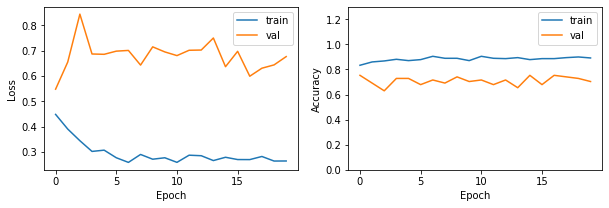

In [42]:
data_train_augmanted = augmentation(x_data_train, y_data_train, aug_generator, batch_size)
data_validation_augmanted = augmentation(x_data_validation, y_data_validation, aug_generator, batch_size)
data_test_augmanted = augmentation(x_data_test, y_data_test, aug_generator, batch_size)

red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.4)
model3.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model3.fit(data_train_augmanted, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= data_validation_augmanted
                 ,callbacks=[red_lr]
                 )
lose, acc = model3.evaluate(data_test_augmanted, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

###Model 4 (Dropout 0.5)

Epoch 1/20
38/38 [==============================] - 3s 75ms/step - loss: 0.5406 - accuracy: 0.8122 - val_loss: 0.8056 - val_accuracy: 0.6790 - lr: 0.0010
Epoch 2/20
38/38 [==============================] - ETA: 0s - loss: 0.6212 - accuracy: 0.7566
Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
38/38 [==============================] - 3s 71ms/step - loss: 0.6212 - accuracy: 0.7566 - val_loss: 1.5025 - val_accuracy: 0.4198 - lr: 0.0010
Epoch 3/20
38/38 [==============================] - ETA: 0s - loss: 0.4412 - accuracy: 0.8307
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.00016000000759959222.
38/38 [==============================] - 3s 71ms/step - loss: 0.4412 - accuracy: 0.8307 - val_loss: 1.4409 - val_accuracy: 0.4321 - lr: 4.0000e-04
Epoch 4/20
38/38 [==============================] - ETA: 0s - loss: 0.4123 - accuracy: 0.8333
Epoch 00004: ReduceLROnPlateau reducing learning rate to 6.40000042039901e-05.
38/38 [===========================

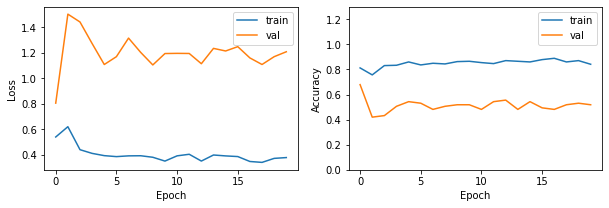

In [44]:
data_train_augmanted = augmentation(x_data_train, y_data_train, aug_generator, batch_size)
data_validation_augmanted = augmentation(x_data_validation, y_data_validation, aug_generator, batch_size)
data_test_augmanted = augmentation(x_data_test, y_data_test, aug_generator, batch_size)

red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.4)
model4.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model4.fit(data_train_augmanted, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= data_validation_augmanted
                 ,callbacks=[red_lr]
                 )
lose, acc = model4.evaluate(data_test_augmanted, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

###Model 5 (Dropout 0.5)

Epoch 1/20
38/38 [==============================] - 3s 74ms/step - loss: 1.0620 - accuracy: 0.3995 - val_loss: 1.0719 - val_accuracy: 0.5309 - lr: 0.0010
Epoch 2/20
38/38 [==============================] - 2s 64ms/step - loss: 0.9045 - accuracy: 0.5714 - val_loss: 0.9689 - val_accuracy: 0.5802 - lr: 0.0010
Epoch 3/20
38/38 [==============================] - 2s 64ms/step - loss: 0.7099 - accuracy: 0.7063 - val_loss: 0.8263 - val_accuracy: 0.6296 - lr: 0.0010
Epoch 4/20
38/38 [==============================] - 2s 64ms/step - loss: 0.6057 - accuracy: 0.7751 - val_loss: 0.7109 - val_accuracy: 0.7160 - lr: 0.0010
Epoch 5/20
38/38 [==============================] - 2s 65ms/step - loss: 0.5786 - accuracy: 0.7937 - val_loss: 0.6530 - val_accuracy: 0.8025 - lr: 0.0010
Epoch 6/20
38/38 [==============================] - ETA: 0s - loss: 0.5742 - accuracy: 0.7778
Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
38/38 [==============================] - 2s 64ms/step - 

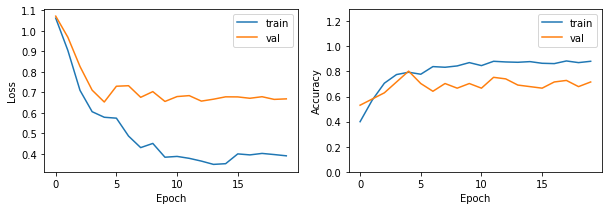

In [48]:
data_train_augmanted = augmentation(x_data_train, y_data_train, aug_generator, batch_size)
data_validation_augmanted = augmentation(x_data_validation, y_data_validation, aug_generator, batch_size)
data_test_augmanted = augmentation(x_data_test, y_data_test, aug_generator, batch_size)

red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.4)
model5.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model5.fit(data_train_augmanted, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= data_validation_augmanted
                 ,callbacks=[red_lr]
                 )
lose, acc = model5.evaluate(data_test_augmanted, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

###Model 6 (Dropout 0.5)

Epoch 1/20
38/38 [==============================] - 2s 65ms/step - loss: 1.2106 - accuracy: 0.3122 - val_loss: 1.0987 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 2/20
38/38 [==============================] - 2s 59ms/step - loss: 1.0949 - accuracy: 0.3677 - val_loss: 1.0978 - val_accuracy: 0.4444 - lr: 0.0010
Epoch 3/20
38/38 [==============================] - 2s 59ms/step - loss: 1.0699 - accuracy: 0.3889 - val_loss: 1.0386 - val_accuracy: 0.5309 - lr: 0.0010
Epoch 4/20
38/38 [==============================] - ETA: 0s - loss: 0.8676 - accuracy: 0.6058
Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
38/38 [==============================] - 2s 60ms/step - loss: 0.8676 - accuracy: 0.6058 - val_loss: 0.9723 - val_accuracy: 0.4815 - lr: 0.0010
Epoch 5/20
38/38 [==============================] - 2s 59ms/step - loss: 0.7421 - accuracy: 0.6455 - val_loss: 0.8639 - val_accuracy: 0.5802 - lr: 4.0000e-04
Epoch 6/20
38/38 [==============================] - ETA: 0s - l

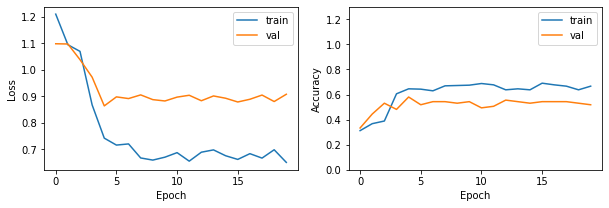

In [51]:
data_train_augmanted = augmentation(x_data_train, y_data_train, aug_generator, batch_size)
data_validation_augmanted = augmentation(x_data_validation, y_data_validation, aug_generator, batch_size)
data_test_augmanted = augmentation(x_data_test, y_data_test, aug_generator, batch_size)

red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.4)
model6.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model6.fit(data_train_augmanted, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= data_validation_augmanted
                 ,callbacks=[red_lr]
                 )
lose, acc = model6.evaluate(data_test_augmanted, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

###Model 7 (Dropout 0.25)

Epoch 1/20
38/38 [==============================] - 3s 70ms/step - loss: 0.5800 - accuracy: 0.7487 - val_loss: 0.7044 - val_accuracy: 0.7037 - lr: 0.0010
Epoch 2/20
38/38 [==============================] - ETA: 0s - loss: 0.5601 - accuracy: 0.7725
Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
38/38 [==============================] - 3s 66ms/step - loss: 0.5601 - accuracy: 0.7725 - val_loss: 0.7758 - val_accuracy: 0.6049 - lr: 0.0010
Epoch 3/20
38/38 [==============================] - ETA: 0s - loss: 0.3908 - accuracy: 0.8492
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.00016000000759959222.
38/38 [==============================] - 3s 72ms/step - loss: 0.3908 - accuracy: 0.8492 - val_loss: 0.7355 - val_accuracy: 0.6914 - lr: 4.0000e-04
Epoch 4/20
38/38 [==============================] - ETA: 0s - loss: 0.3349 - accuracy: 0.8836
Epoch 00004: ReduceLROnPlateau reducing learning rate to 6.40000042039901e-05.
38/38 [===========================

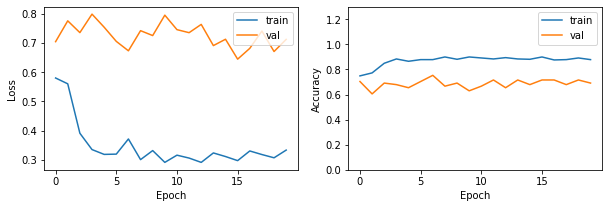

In [59]:
data_train_augmanted = augmentation(x_data_train, y_data_train, aug_generator, batch_size)
data_validation_augmanted = augmentation(x_data_validation, y_data_validation, aug_generator, batch_size)
data_test_augmanted = augmentation(x_data_test, y_data_test, aug_generator, batch_size)

red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.4)
model7.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model7.fit(data_train_augmanted, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= data_validation_augmanted
                 ,callbacks=[red_lr]
                 )
lose, acc = model7.evaluate(data_test_augmanted, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

### Model 8 (Dropout 0.25)

Epoch 1/20
38/38 [==============================] - 3s 68ms/step - loss: 0.7119 - accuracy: 0.7434 - val_loss: 0.6987 - val_accuracy: 0.7037 - lr: 0.0010
Epoch 2/20
38/38 [==============================] - 2s 65ms/step - loss: 0.4927 - accuracy: 0.7937 - val_loss: 0.6504 - val_accuracy: 0.7284 - lr: 0.0010
Epoch 3/20
37/38 [============================>.] - ETA: 0s - loss: 0.4435 - accuracy: 0.8424
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
38/38 [==============================] - 2s 64ms/step - loss: 0.4423 - accuracy: 0.8413 - val_loss: 0.7069 - val_accuracy: 0.6173 - lr: 0.0010
Epoch 4/20
38/38 [==============================] - 2s 65ms/step - loss: 0.3726 - accuracy: 0.8757 - val_loss: 0.6172 - val_accuracy: 0.7407 - lr: 4.0000e-04
Epoch 5/20
38/38 [==============================] - ETA: 0s - loss: 0.3974 - accuracy: 0.8280
Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00016000000759959222.
38/38 [==============================] - 3

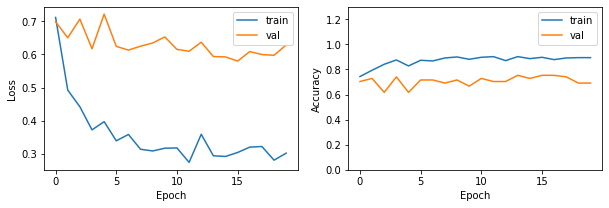

In [60]:
data_train_augmanted = augmentation(x_data_train, y_data_train, aug_generator, batch_size)
data_validation_augmanted = augmentation(x_data_validation, y_data_validation, aug_generator, batch_size)
data_test_augmanted = augmentation(x_data_test, y_data_test, aug_generator, batch_size)

red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.4)
model8.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model8.fit(data_train_augmanted, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= data_validation_augmanted
                 ,callbacks=[red_lr]
                 )
lose, acc = model8.evaluate(data_test_augmanted, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

###Model 9 (Dropout 0.25)

Epoch 1/20
38/38 [==============================] - 2s 64ms/step - loss: 0.6519 - accuracy: 0.8016 - val_loss: 0.6478 - val_accuracy: 0.7160 - lr: 0.0010
Epoch 2/20
37/38 [============================>.] - ETA: 0s - loss: 0.4434 - accuracy: 0.8533
Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
38/38 [==============================] - 2s 60ms/step - loss: 0.4403 - accuracy: 0.8519 - val_loss: 0.6130 - val_accuracy: 0.7037 - lr: 0.0010
Epoch 3/20
38/38 [==============================] - ETA: 0s - loss: 0.3248 - accuracy: 0.8810
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.00016000000759959222.
38/38 [==============================] - 2s 61ms/step - loss: 0.3248 - accuracy: 0.8810 - val_loss: 0.6861 - val_accuracy: 0.7160 - lr: 4.0000e-04
Epoch 4/20
37/38 [============================>.] - ETA: 0s - loss: 0.3212 - accuracy: 0.8913
Epoch 00004: ReduceLROnPlateau reducing learning rate to 6.40000042039901e-05.
38/38 [===========================

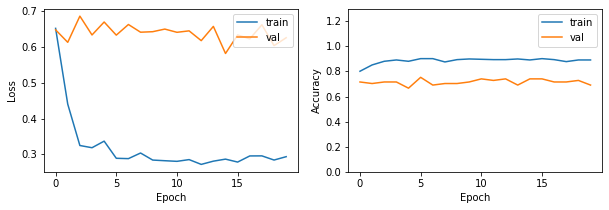

In [61]:
data_train_augmanted = augmentation(x_data_train, y_data_train, aug_generator, batch_size)
data_validation_augmanted = augmentation(x_data_validation, y_data_validation, aug_generator, batch_size)
data_test_augmanted = augmentation(x_data_test, y_data_test, aug_generator, batch_size)

red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.4)
model9.compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
history = model9.fit(data_train_augmanted, 
                 batch_size= batch_size,
                 epochs= epochs,
                 verbose= 1,
                 validation_data= data_validation_augmanted
                 ,callbacks=[red_lr]
                 )
lose, acc = model9.evaluate(data_test_augmanted, verbose=1)
print("\n===============Model Result===================")
print("Train Loss:", round(lose, 2))
print("Train Accuracy:", round(acc*100, 2), " %")
print("========================================================\n")
model_result_checker(history)

##Multiple Train (No Data Augmentation)

======RUNNING MODEL Model1 WITH NO DATA AUGMENTATION======

===============Model Model1 Result===================
Train Loss: 0.44
Train Accuracy: 83.95  %



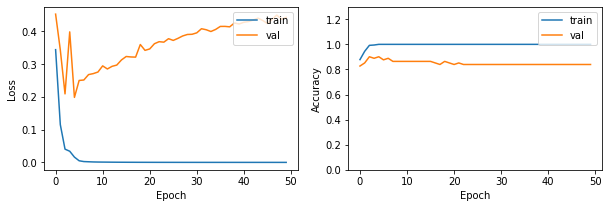

======RUNNING MODEL Model2 WITH NO DATA AUGMENTATION======

===============Model Model2 Result===================
Train Loss: 0.4
Train Accuracy: 90.12  %



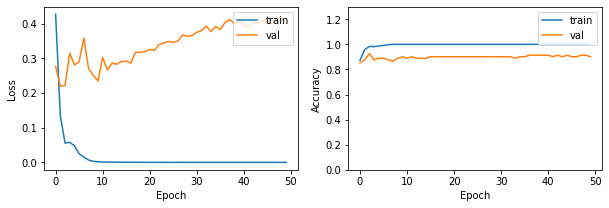

======RUNNING MODEL Model3 WITH NO DATA AUGMENTATION======

===============Model Model3 Result===================
Train Loss: 0.28
Train Accuracy: 95.06  %



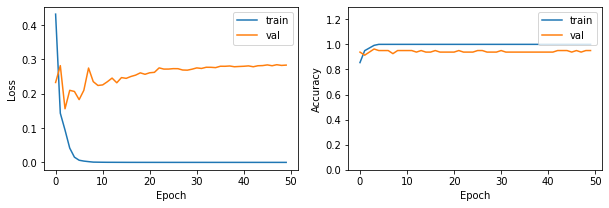

======RUNNING MODEL Model1(0.5) WITH NO DATA AUGMENTATION======

===============Model Model1(0.5) Result===================
Train Loss: 0.53
Train Accuracy: 83.95  %



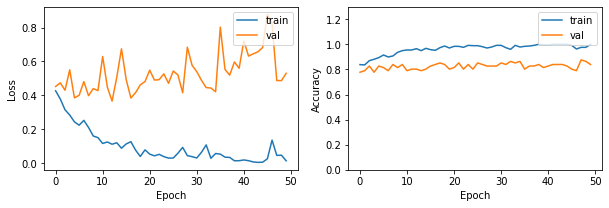

======RUNNING MODEL Model2(0.5) WITH NO DATA AUGMENTATION======

===============Model Model2(0.5) Result===================
Train Loss: 0.24
Train Accuracy: 91.36  %



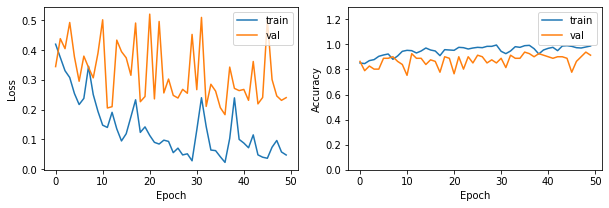

======RUNNING MODEL Model3(0.5) WITH NO DATA AUGMENTATION======

===============Model Model3(0.5) Result===================
Train Loss: 0.41
Train Accuracy: 87.65  %



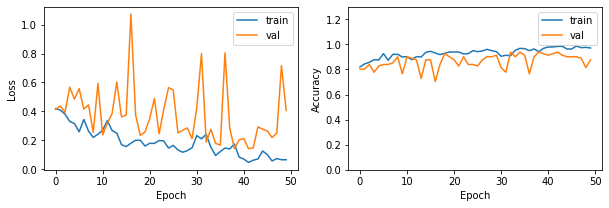

======RUNNING MODEL Model1(0.25) WITH NO DATA AUGMENTATION======

===============Model Model1(0.25) Result===================
Train Loss: 0.35
Train Accuracy: 82.72  %



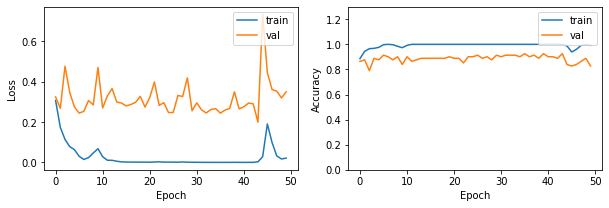

======RUNNING MODEL Model2(0.25) WITH NO DATA AUGMENTATION======

===============Model Model2(0.25) Result===================
Train Loss: 0.17
Train Accuracy: 92.59  %



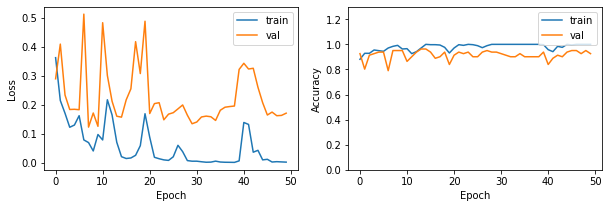

======RUNNING MODEL Model3(0.25) WITH NO DATA AUGMENTATION======

===============Model Model3(0.25) Result===================
Train Loss: 0.42
Train Accuracy: 86.42  %



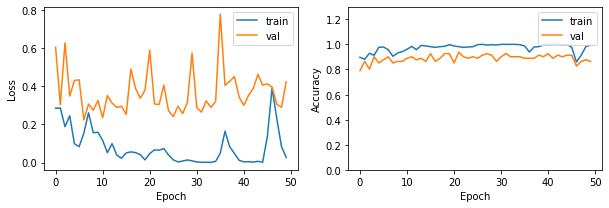

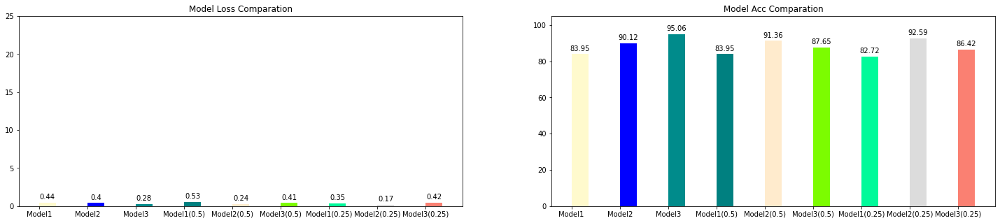

In [41]:
epoch_train = 50
batch_size_train = 16

dummy_models = [model1, model2, model3, model4, model5, model6, model7, model8, model9]
dummy_model_labels = ["Model1", "Model2", "Model3", "Model1(0.5)", "Model2(0.5)", "Model3(0.5)", "Model1(0.25)", "Model2(0.25)", "Model3(0.25)"]

red_lr= ReduceLROnPlateau(monitor='val_loss',patience=1,verbose=1,factor=0.1)

loses_models = []
acc_models = []

for i in range(0, len(dummy_models)):
  print("======RUNNING MODEL", dummy_model_labels[i], "WITH NO DATA AUGMENTATION======")
  dummy_models[i].compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
  history = dummy_models[i].fit(input_data_2, input_data_label_2, 
                  batch_size= batch_size_train,
                  epochs= epoch_train,
                  verbose= 0,
                  validation_data= (input_data_val_2, input_data_val_label_2)
                  #,callbacks=[red_lr]
                  )
  lose, acc = dummy_models[i].evaluate(input_data_val_2, input_data_val_label_2, verbose=0)
  print("\n===============Model", dummy_model_labels[i],"Result===================")
  print("Train Loss:", round(lose, 2))
  print("Train Accuracy:", round(acc*100, 2), " %")
  print("=========================================================\n")
  loses_models.append(round(lose, 2))
  acc_models.append(round(acc*100, 2))
  model_result_checker(history)
result_train_models(loses_models, acc_models, dummy_model_labels)

## Multiple Train (Data Augmentation)

======RUNNING MODEL Model1 WITH DATA AUGMENTATION======

===============Model Model1 Result===================
Train Loss: 0.3
Train Accuracy: 87.65  %



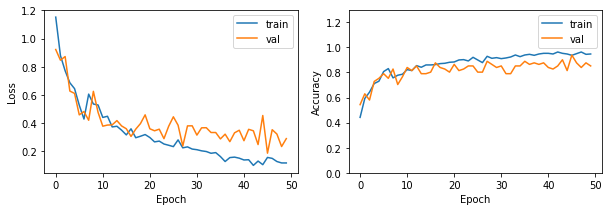

======RUNNING MODEL Model2 WITH DATA AUGMENTATION======

===============Model Model2 Result===================
Train Loss: 0.28
Train Accuracy: 87.65  %



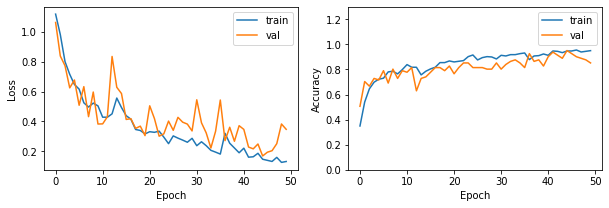

======RUNNING MODEL Model3 WITH DATA AUGMENTATION======

===============Model Model3 Result===================
Train Loss: 0.28
Train Accuracy: 87.65  %



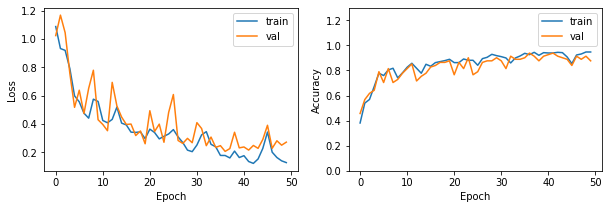

======RUNNING MODEL Model1(0.5) WITH DATA AUGMENTATION======

===============Model Model1(0.5) Result===================
Train Loss: 0.55
Train Accuracy: 71.6  %



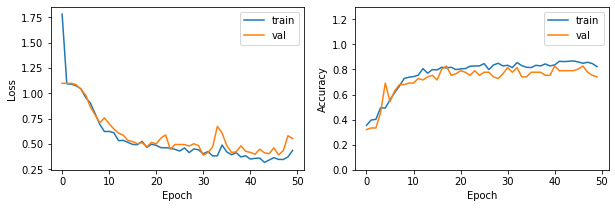

======RUNNING MODEL Model2(0.5) WITH DATA AUGMENTATION======

===============Model Model2(0.5) Result===================
Train Loss: 0.48
Train Accuracy: 79.01  %



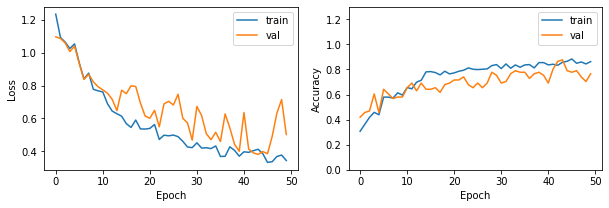

======RUNNING MODEL Model3(0.5) WITH DATA AUGMENTATION======

===============Model Model3(0.5) Result===================
Train Loss: 0.45
Train Accuracy: 80.25  %



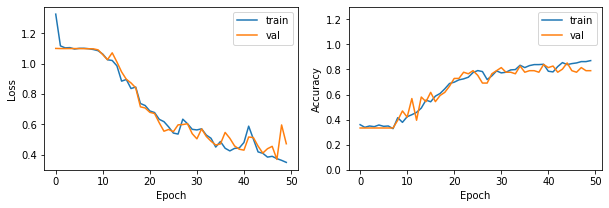

======RUNNING MODEL Model1(0.25) WITH DATA AUGMENTATION======

===============Model Model1(0.25) Result===================
Train Loss: 0.32
Train Accuracy: 88.89  %



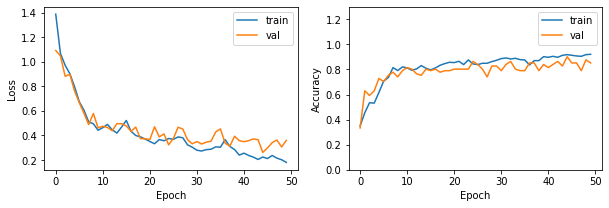

======RUNNING MODEL Model2(0.25) WITH DATA AUGMENTATION======

===============Model Model2(0.25) Result===================
Train Loss: 0.34
Train Accuracy: 86.42  %



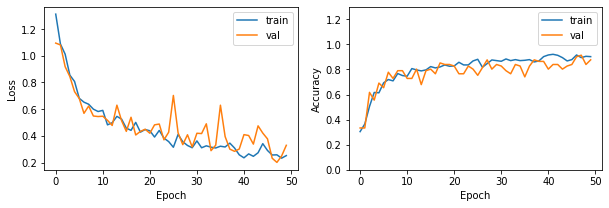

======RUNNING MODEL Model3(0.25) WITH DATA AUGMENTATION======

===============Model Model3(0.25) Result===================
Train Loss: 0.26
Train Accuracy: 88.89  %



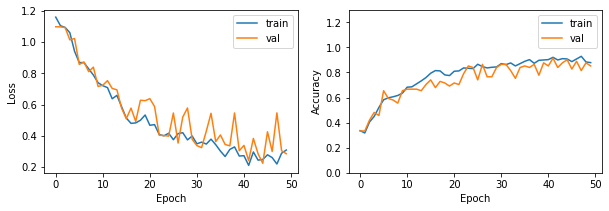

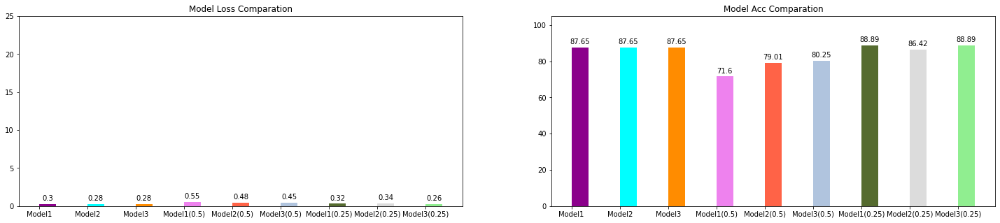

In [21]:
epoch_train = 50
batch_size_train = 16

dummy_models = [model1, model2, model3, model4, model5, model6, model7, model8, model9]
dummy_model_labels = ["Model1", "Model2", "Model3", "Model1(0.5)", "Model2(0.5)", "Model3(0.5)", "Model1(0.25)", "Model2(0.25)", "Model3(0.25)"]

red_lr= ReduceLROnPlateau(monitor='val_loss',patience=1,verbose=1,factor=0.1)

loses_models = []
acc_models = []

for i in range(0, len(dummy_models)):

  data_train_augmanted = augmentation(input_data_2, input_data_label_2, aug_generator)
  data_validation_augmanted = augmentation(input_data_val_2, input_data_val_label_2, aug_generator)
  data_test_augmanted = augmentation(input_data_test_2, input_data_test_label_2, aug_generator)

  print("======RUNNING MODEL", dummy_model_labels[i], "WITH DATA AUGMENTATION======")
  dummy_models[i].compile(optimizer=optimizer_function, loss=loss_function, metrics=['accuracy'])
  history = dummy_models[i].fit(data_train_augmanted, 
                  batch_size= batch_size_train,
                  epochs= epoch_train,
                  verbose= 0,
                  validation_data= data_validation_augmanted
                  #,callbacks=[red_lr]
                  )
  lose, acc = dummy_models[i].evaluate(data_validation_augmanted, verbose=0)
  print("\n===============Model", dummy_model_labels[i],"Result===================")
  print("Train Loss:", round(lose, 2))
  print("Train Accuracy:", round(acc*100, 2), " %")
  print("=========================================================\n")
  loses_models.append(round(lose, 2))
  acc_models.append(round(acc*100, 2))
  model_result_checker(history)
result_train_models(loses_models, acc_models, dummy_model_labels)

##Save Model

In [215]:
cur_model = model1
cur_model.save('/content/model_1_(Base Model 1).h5')

In [ ]:
recap_losses2 = []
recap_accuracy2 = []
k_fold = 5

for m in range(0, len(k_fold_models)):
  fold_title = []
  losses = []
  accs = []

  folds = list(StratifiedKFold(n_splits=k_fold, shuffle=True, random_state=1).split(x_dataset, y_dataset))

  for fold, (train_index, val_index) in enumerate(folds):
    x_train = x_dataset[train_index]
    y_train = y_dataset[train_index]
    x_val, x_test = split_list(x_dataset[val_index])
    y_val, y_test = split_list(y_dataset[val_index])

    data_train_augmanted = augmentation(x_train, y_train, aug_generator, batch_size)
    data_validation_augmanted = augmentation(x_val, y_val, aug_generator, batch_size)
    data_test_augmanted = augmentation(x_test, y_test, aug_generator, batch_size)

    title = "%s%s" % ("Fold ", fold + 1)
    print(title, "is running . . .")
    fold_title.append(title)
    red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.1)
    k_fold_models[m].compile(loss = loss_function, optimizer = optimizer_function, metrics=['accuracy'])
    history = k_fold_models[m].fit(data_train_augmanted, 
                      batch_size= batch_size,
                      epochs= epochs,
                      verbose= 1,
                      validation_data= data_validation_augmanted
                      ,callbacks=[red_lr]
                      )
    loss, acc = k_fold_models[m].evaluate(x_test, y_test, verbose=1)
    losses.append(round(loss, 2))
    accs.append(round(acc*100, 2))
    model_result_checker(history)
  result_train_models(losses, accs, fold_title)
  print("========== AVERAGE TRAIN OF", k_fold_model_labels[m] ,"===========")
  print("Fold Accuracy Average:", round(average_result(accs)))
  print("Fold Loss Average:", round(average_result(losses), 2))
  print("Fold Accuracy Larges Value:", max(accs))
  print("Fold Loss Larges Value:", max(losses))
  print("==============================")
  recap_losses2.append(round(average_result(losses), 2))
  recap_accuracy2.append(round(average_result(accs), 2))

result_train_models(recap_losses2, recap_accuracy2, k_fold_model_labels)

#K-Fold Cross Validation

## Fold Configuration

In [19]:
x_dataset = x_data_complete
y_dataset = y_data_complete

k_fold_models = [model1, model2, model3, model4, model5, model6, model7, model8, model9]
k_fold_model_labels = ["Model1", "Model2", "Model3", "Model1(0.5)", "Model2(0.5)", "Model3(0.5)", "Model1(0.25)", "Model2(0.25)", "Model3(0.25)"]

def split_list(a_list):
    half = len(a_list)//2
    return a_list[:half], a_list[half:]

## Multiple Train (No Data Augmentation)

Fold 1 is running . . .


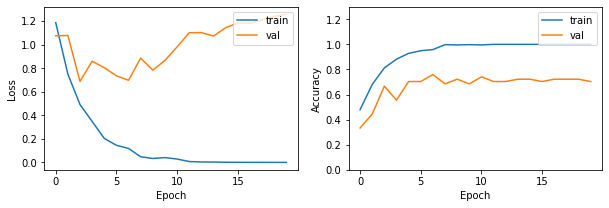

Fold 2 is running . . .


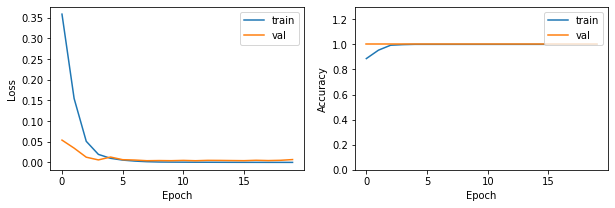

Fold 3 is running . . .


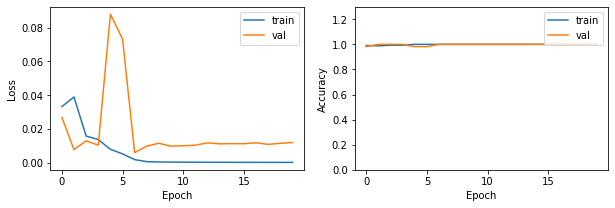

Fold 4 is running . . .


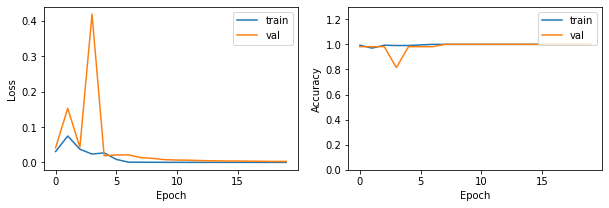

Fold 5 is running . . .


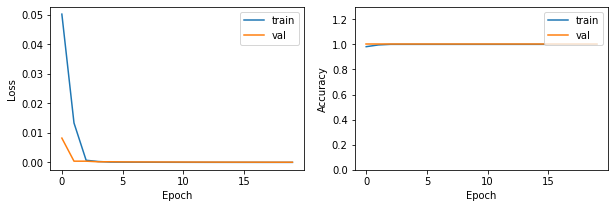

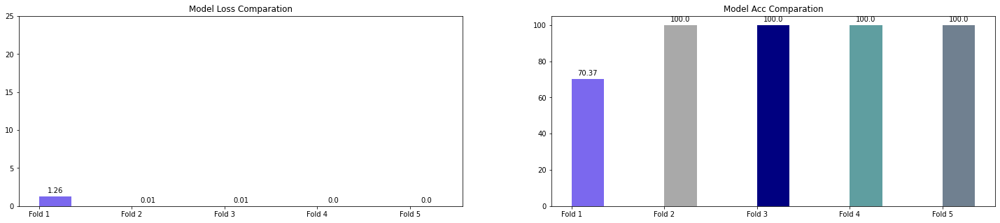

========== AVERAGE TRAIN OF Model1 ===========
Fold Accuracy Average: 94
Fold Loss Average: 0.26
Fold Accuracy Larges Value: 100.0
Fold Loss Larges Value: 1.26
Fold 1 is running . . .


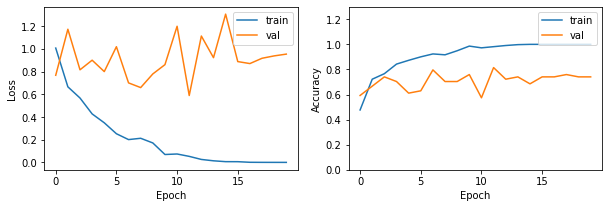

Fold 2 is running . . .


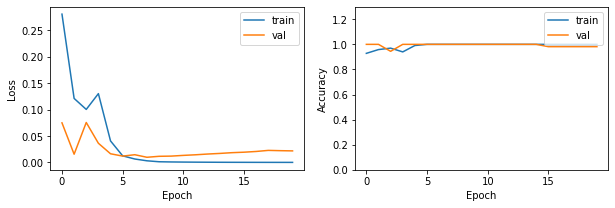

Fold 3 is running . . .


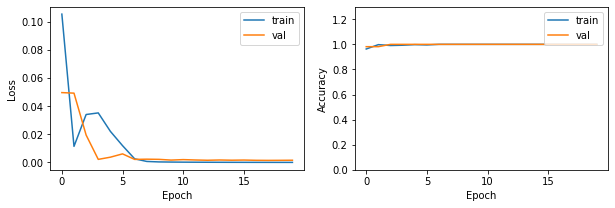

Fold 4 is running . . .


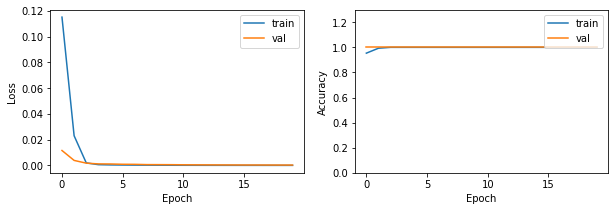

Fold 5 is running . . .


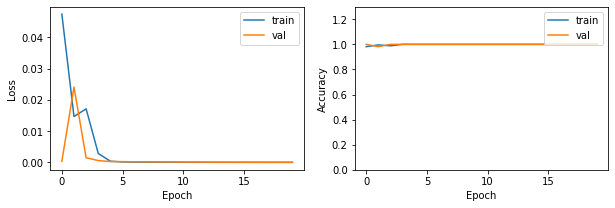

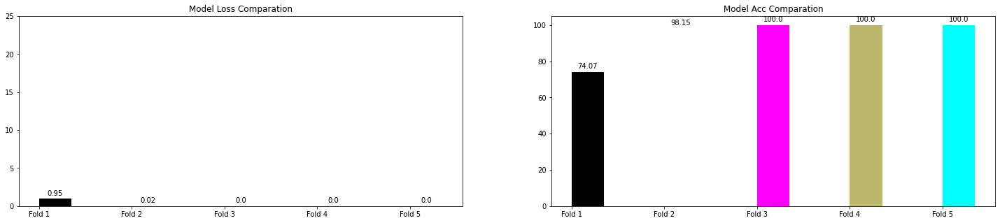

========== AVERAGE TRAIN OF Model2 ===========
Fold Accuracy Average: 94
Fold Loss Average: 0.19
Fold Accuracy Larges Value: 100.0
Fold Loss Larges Value: 0.95
Fold 1 is running . . .


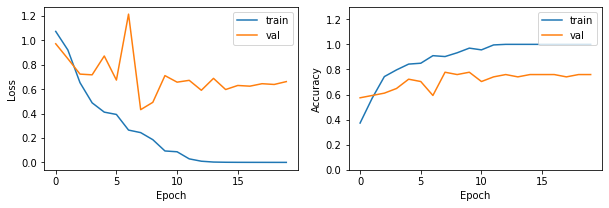

Fold 2 is running . . .


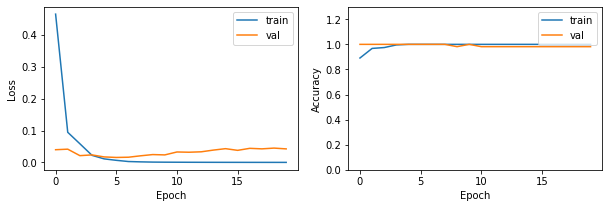

Fold 3 is running . . .


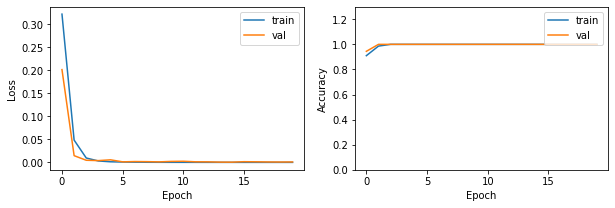

Fold 4 is running . . .


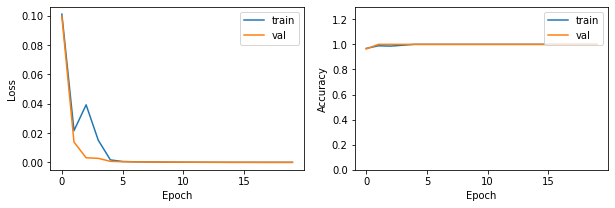

Fold 5 is running . . .


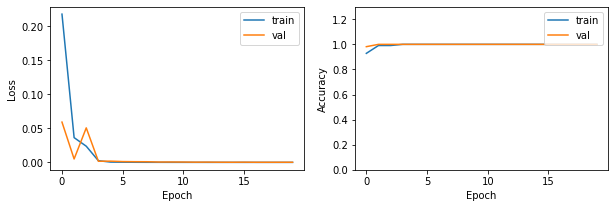

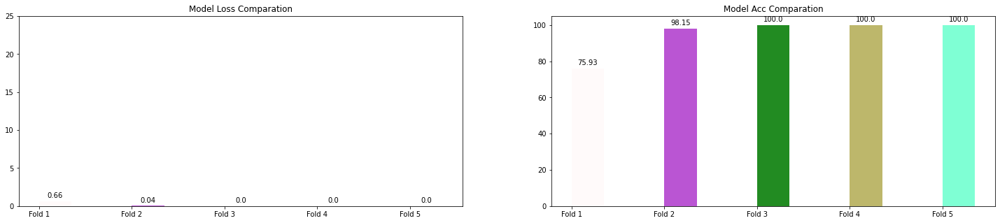

========== AVERAGE TRAIN OF Model3 ===========
Fold Accuracy Average: 95
Fold Loss Average: 0.14
Fold Accuracy Larges Value: 100.0
Fold Loss Larges Value: 0.66
Fold 1 is running . . .


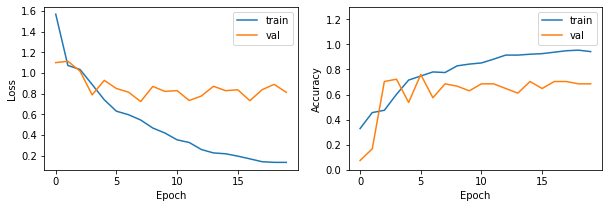

Fold 2 is running . . .


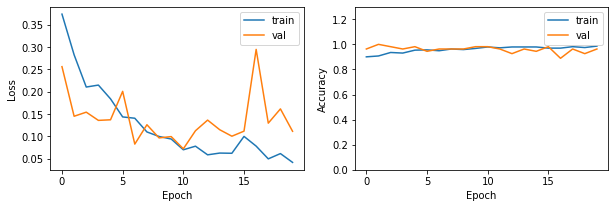

Fold 3 is running . . .


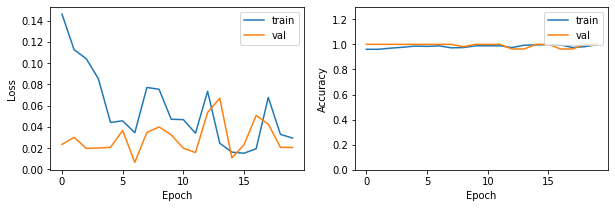

Fold 4 is running . . .


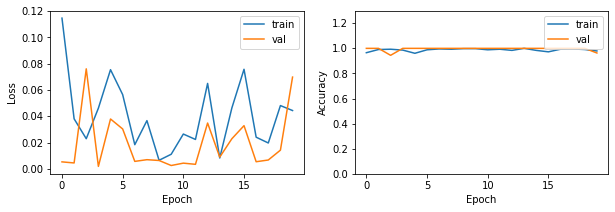

Fold 5 is running . . .


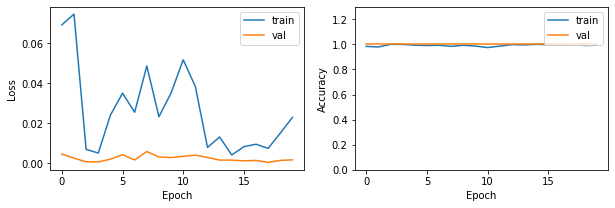

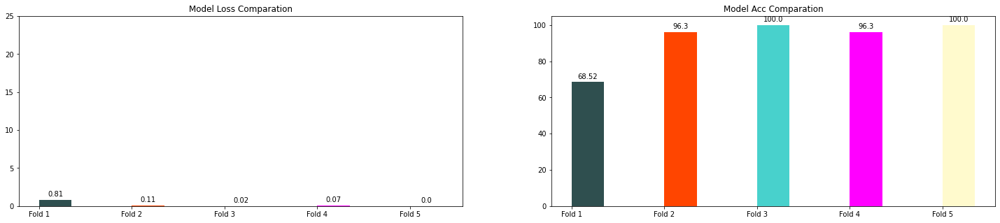

========== AVERAGE TRAIN OF Model1(0.5) ===========
Fold Accuracy Average: 92
Fold Loss Average: 0.2
Fold Accuracy Larges Value: 100.0
Fold Loss Larges Value: 0.81
Fold 1 is running . . .


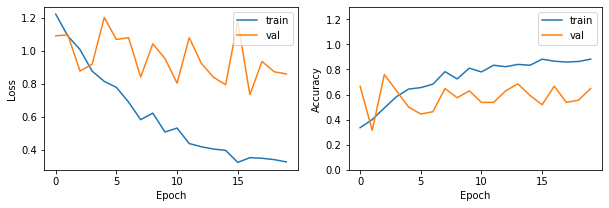

Fold 2 is running . . .


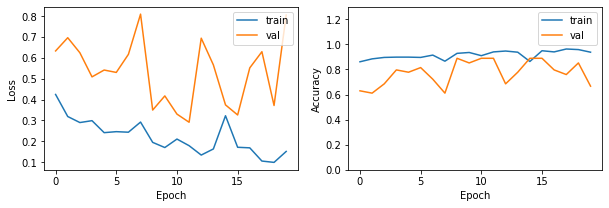

Fold 3 is running . . .


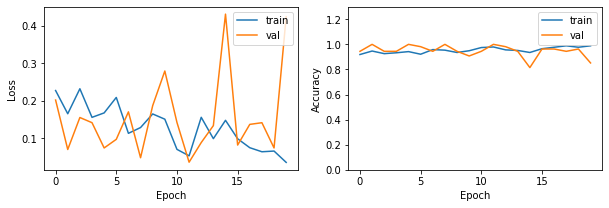

Fold 4 is running . . .


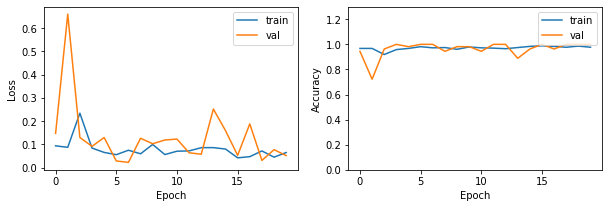

Fold 5 is running . . .


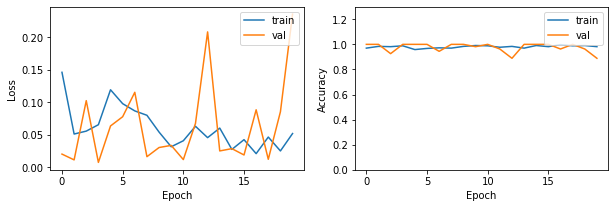

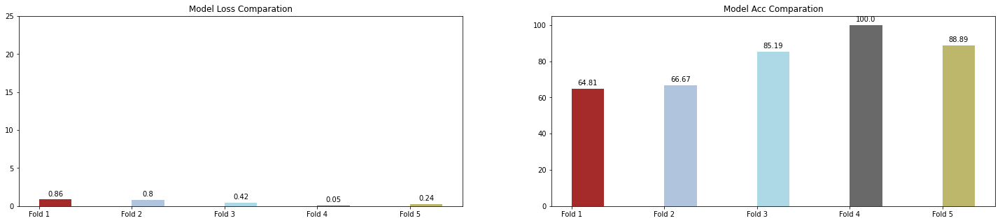

========== AVERAGE TRAIN OF Model2(0.5) ===========
Fold Accuracy Average: 81
Fold Loss Average: 0.47
Fold Accuracy Larges Value: 100.0
Fold Loss Larges Value: 0.86
Fold 1 is running . . .


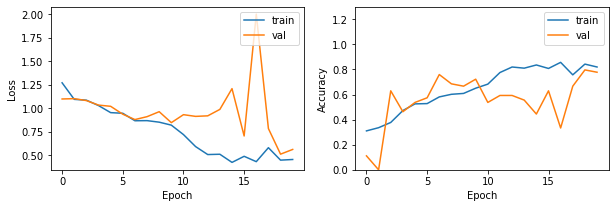

Fold 2 is running . . .


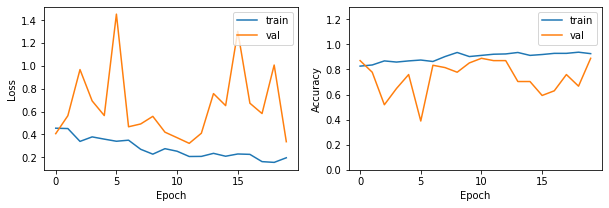

Fold 3 is running . . .


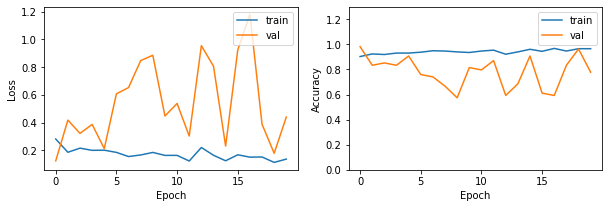

Fold 4 is running . . .


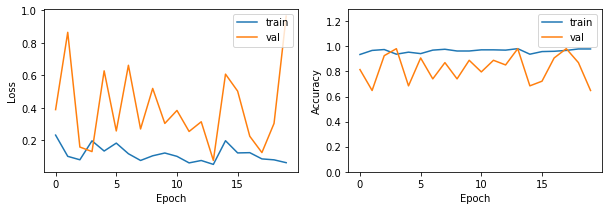

Fold 5 is running . . .


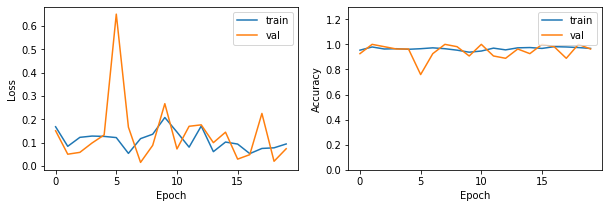

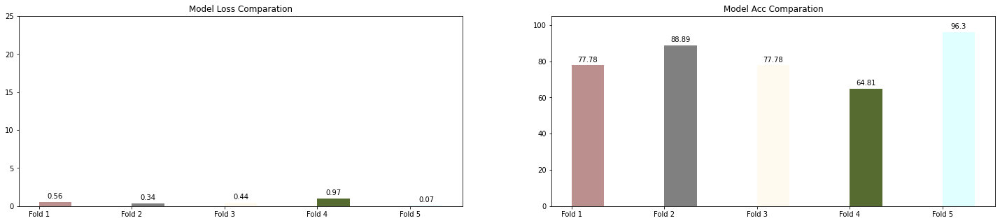

========== AVERAGE TRAIN OF Model3(0.5) ===========
Fold Accuracy Average: 81
Fold Loss Average: 0.48
Fold Accuracy Larges Value: 96.3
Fold Loss Larges Value: 0.97
Fold 1 is running . . .


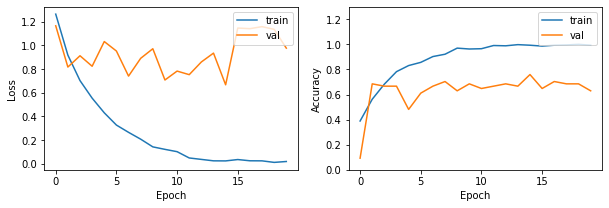

Fold 2 is running . . .


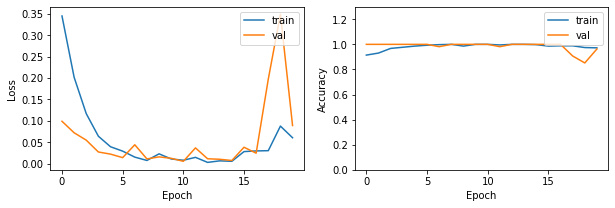

Fold 3 is running . . .


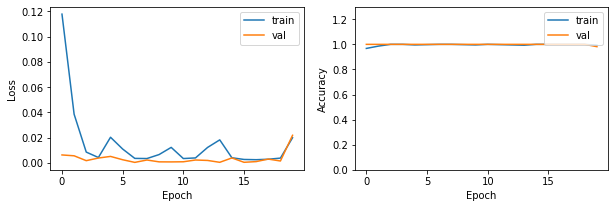

Fold 4 is running . . .


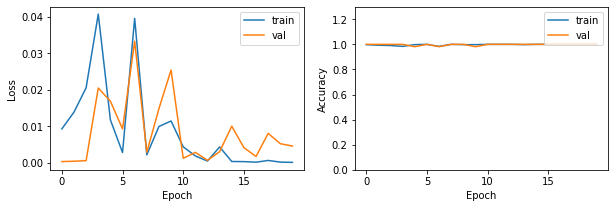

Fold 5 is running . . .


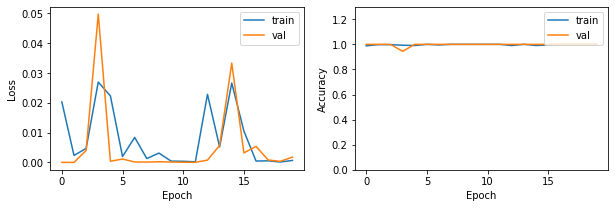

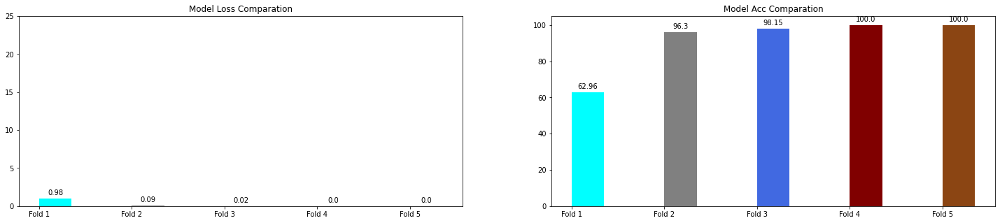

========== AVERAGE TRAIN OF Model1(0.25) ===========
Fold Accuracy Average: 91
Fold Loss Average: 0.22
Fold Accuracy Larges Value: 100.0
Fold Loss Larges Value: 0.98
Fold 1 is running . . .


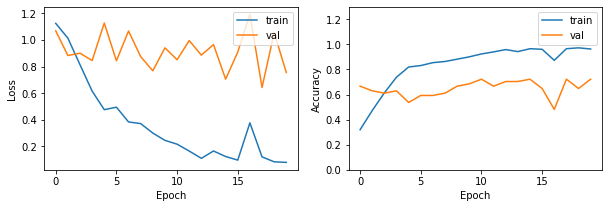

Fold 2 is running . . .


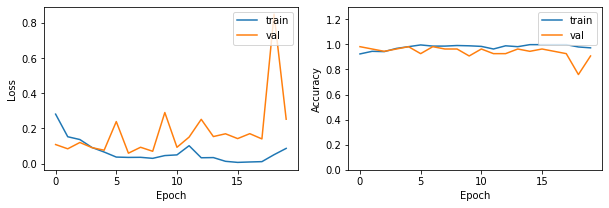

Fold 3 is running . . .


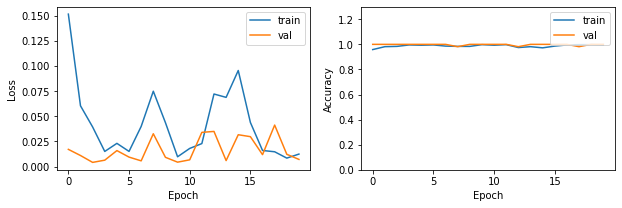

Fold 4 is running . . .


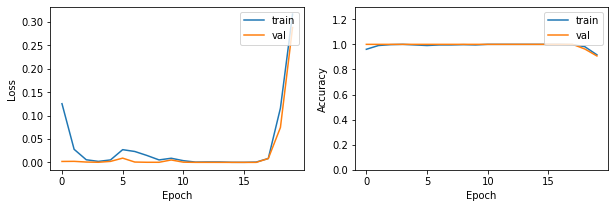

Fold 5 is running . . .


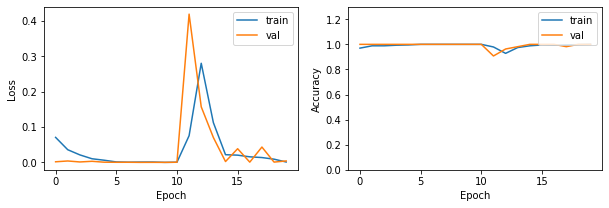

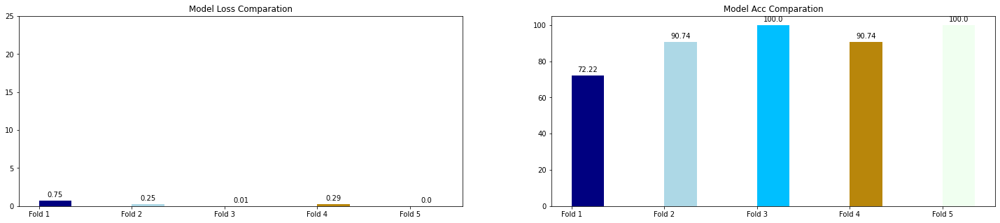

========== AVERAGE TRAIN OF Model2(0.25) ===========
Fold Accuracy Average: 91
Fold Loss Average: 0.26
Fold Accuracy Larges Value: 100.0
Fold Loss Larges Value: 0.75
Fold 1 is running . . .


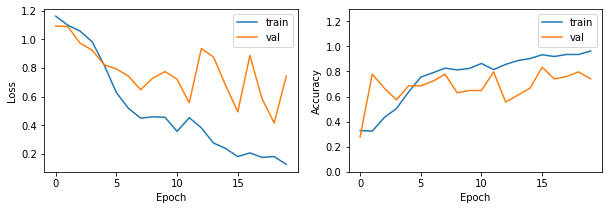

Fold 2 is running . . .


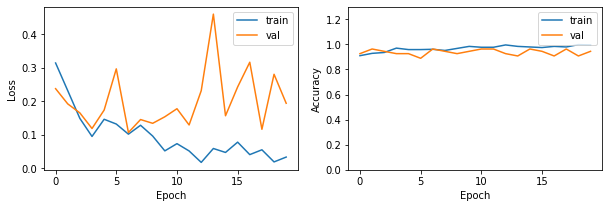

Fold 3 is running . . .


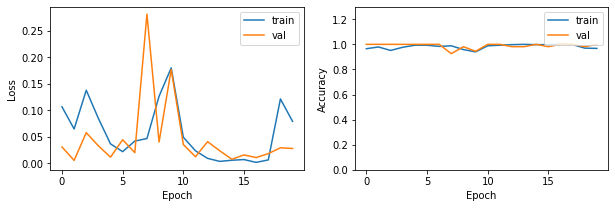

Fold 4 is running . . .


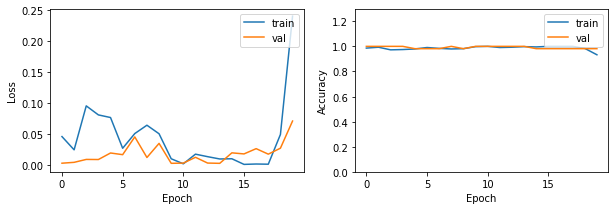

Fold 5 is running . . .


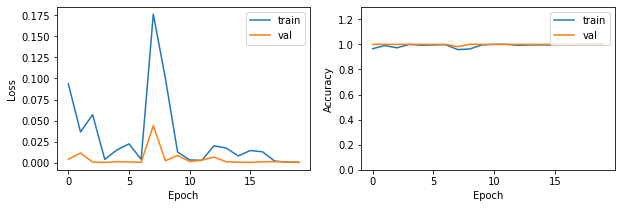

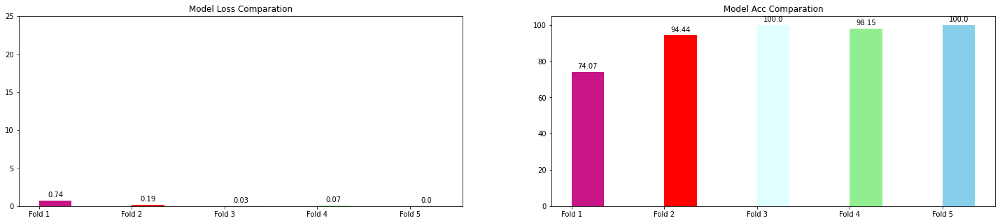

========== AVERAGE TRAIN OF Model3(0.25) ===========
Fold Accuracy Average: 93
Fold Loss Average: 0.21
Fold Accuracy Larges Value: 100.0
Fold Loss Larges Value: 0.74


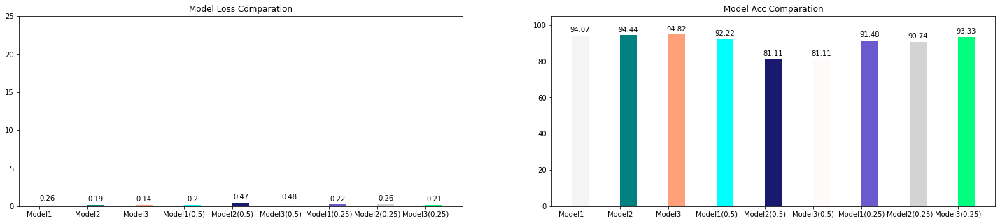

In [20]:
recap_losses = []
recap_accuracy = []
k_fold = 5
epoch_train = 20
batch_size_train = 16

for m in range(0, len(k_fold_models)):
  fold_title = []
  losses = []
  accs = []

  folds = list(StratifiedKFold(n_splits=k_fold, shuffle=True, random_state=1).split(x_dataset, y_dataset))

  for fold, (train_index, val_index) in enumerate(folds):
    x_train = x_dataset[train_index]
    y_train = y_dataset[train_index]
    x_val, x_test = split_list(x_dataset[val_index])
    y_val, y_test = split_list(y_dataset[val_index])
    title = "%s%s" % ("Fold ", fold + 1)
    print(title, "is running . . .")
    fold_title.append(title)
    red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=1,factor=0.1)
    k_fold_models[m].compile(loss = loss_function, optimizer = optimizer_function, metrics=['accuracy'])
    history = k_fold_models[m].fit(x_train,
                      y_train, 
                      batch_size= batch_size_train,
                      epochs= epoch_train,
                      verbose= 0,
                      validation_data= (x_val, y_val)
                      #,callbacks=[red_lr]
                      )
    loss, acc = k_fold_models[m].evaluate(x_val, y_val, verbose=0)
    losses.append(round(loss, 2))
    accs.append(round(acc*100, 2))
    model_result_checker(history)
  result_train_models(losses, accs, fold_title)
  print("========== AVERAGE TRAIN OF", k_fold_model_labels[m] ,"===========")
  print("Fold Accuracy Average:", round(average_result(accs)))
  print("Fold Loss Average:", round(average_result(losses), 2))
  print("Fold Accuracy Larges Value:", max(accs))
  print("Fold Loss Larges Value:", max(losses))
  print("==============================")
  recap_losses.append(round(average_result(losses), 2))
  recap_accuracy.append(round(average_result(accs), 2))

result_train_models(recap_losses, recap_accuracy, k_fold_model_labels)

## Multiple Train (With Data Augmentation)

Fold 1 is running . . .


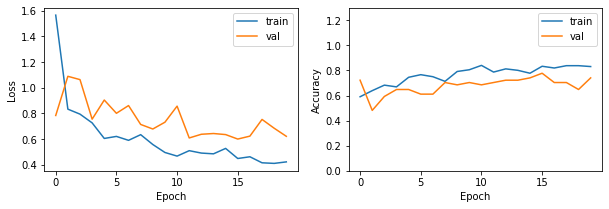

Fold 2 is running . . .


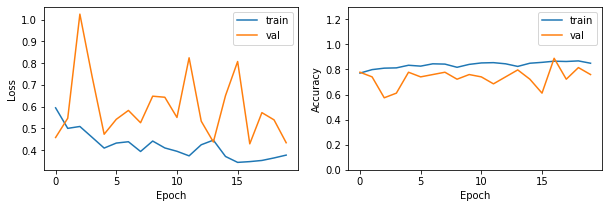

Fold 3 is running . . .


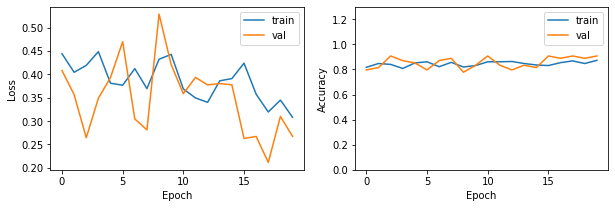

Fold 4 is running . . .


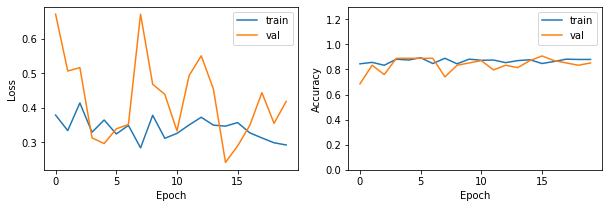

Fold 5 is running . . .


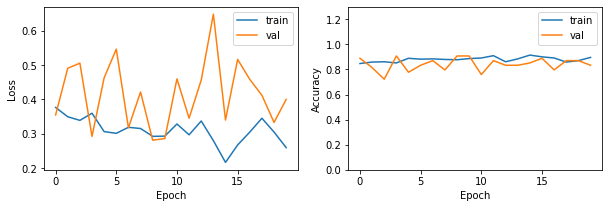

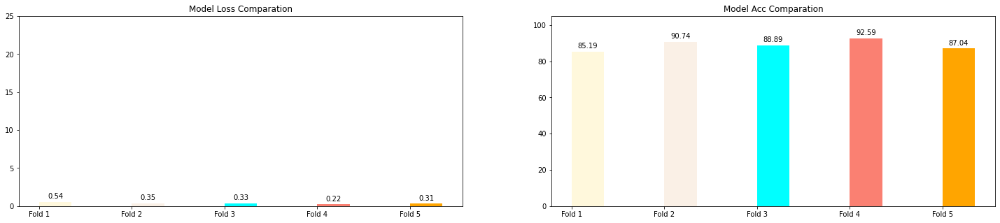

========== AVERAGE TRAIN OF Model1 ===========
Fold Accuracy Average: 89
Fold Loss Average: 0.35
Fold Accuracy Larges Value: 92.59
Fold Loss Larges Value: 0.54
Fold 1 is running . . .


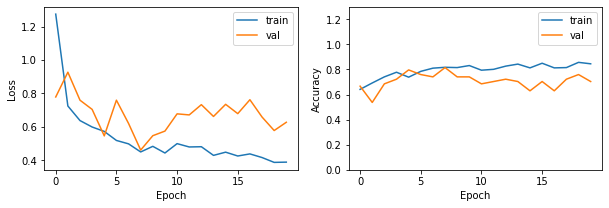

Fold 2 is running . . .


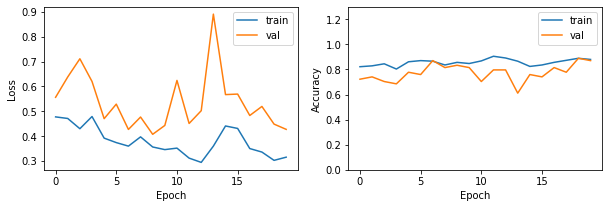

Fold 3 is running . . .


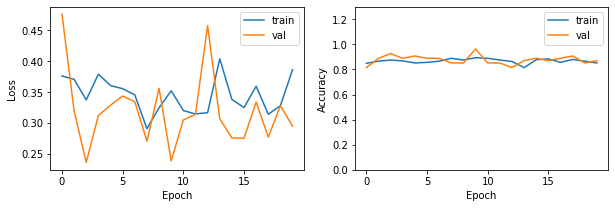

Fold 4 is running . . .


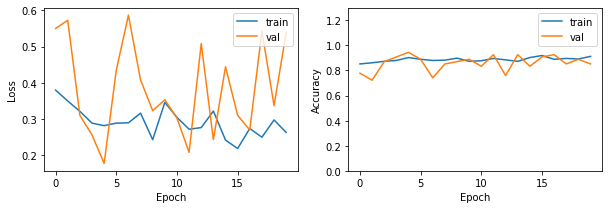

Fold 5 is running . . .


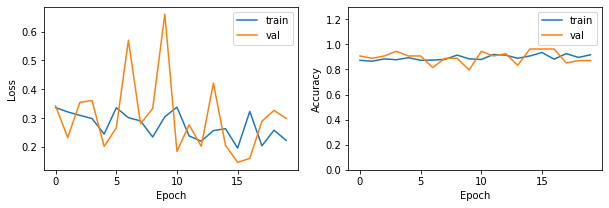

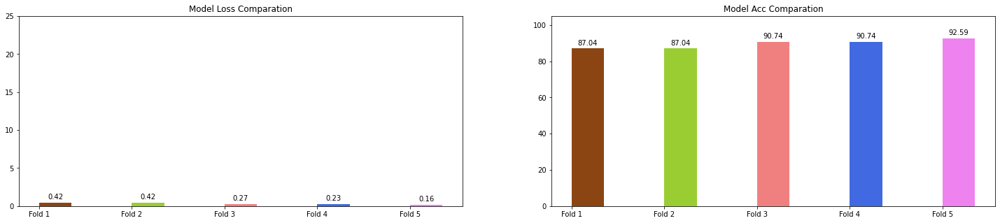

========== AVERAGE TRAIN OF Model2 ===========
Fold Accuracy Average: 90
Fold Loss Average: 0.3
Fold Accuracy Larges Value: 92.59
Fold Loss Larges Value: 0.42
Fold 1 is running . . .


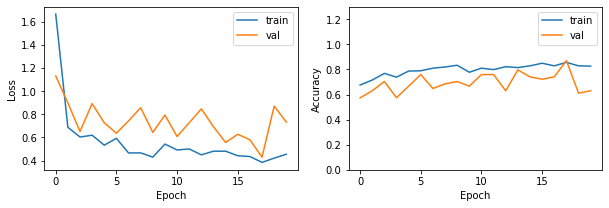

Fold 2 is running . . .


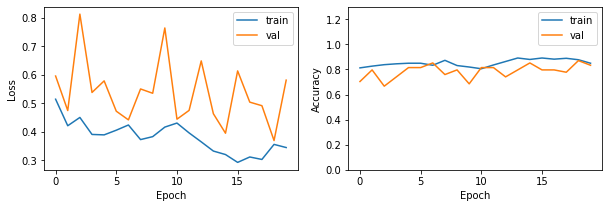

Fold 3 is running . . .


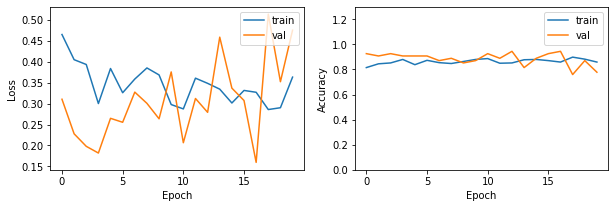

Fold 4 is running . . .


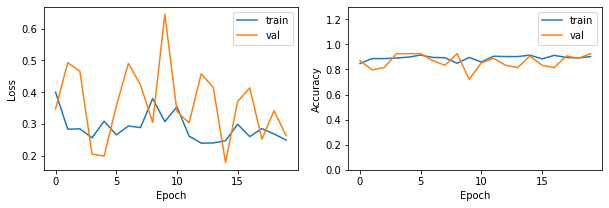

Fold 5 is running . . .


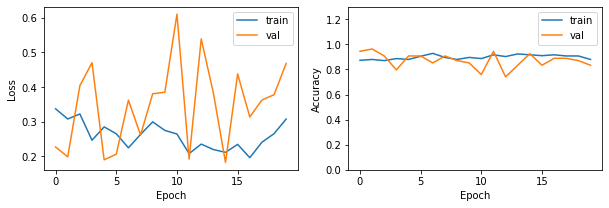

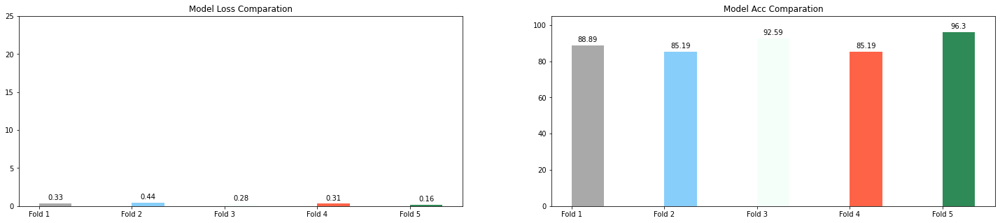

========== AVERAGE TRAIN OF Model3 ===========
Fold Accuracy Average: 90
Fold Loss Average: 0.3
Fold Accuracy Larges Value: 96.3
Fold Loss Larges Value: 0.44
Fold 1 is running . . .


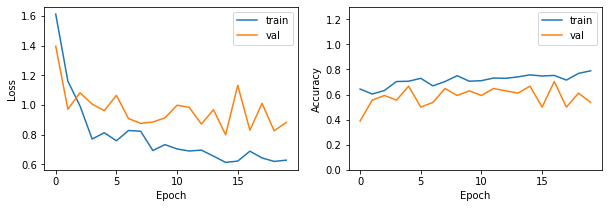

Fold 2 is running . . .


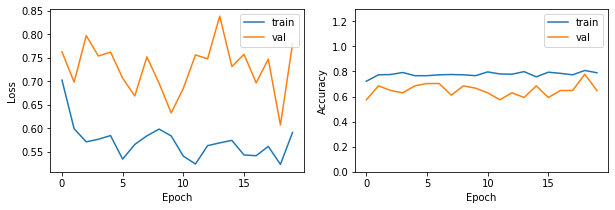

Fold 3 is running . . .


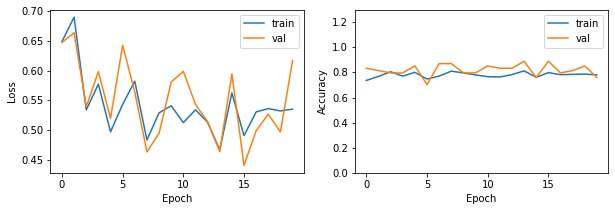

Fold 4 is running . . .


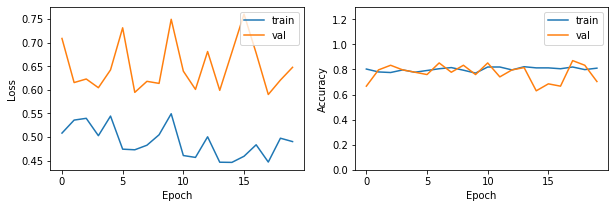

Fold 5 is running . . .


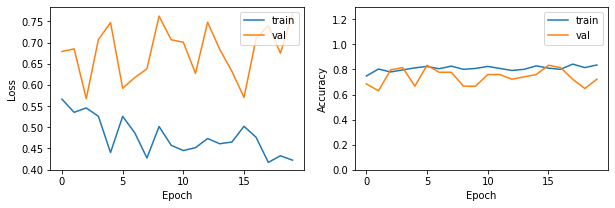

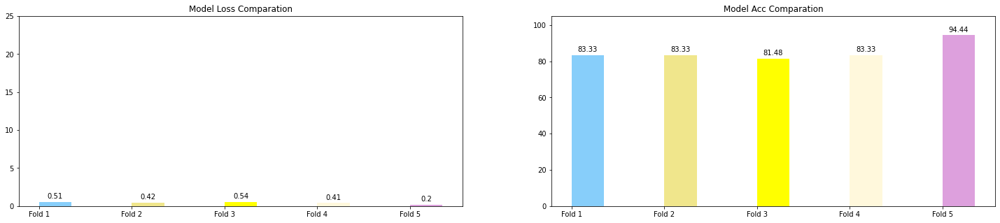

========== AVERAGE TRAIN OF Model1(0.5) ===========
Fold Accuracy Average: 85
Fold Loss Average: 0.42
Fold Accuracy Larges Value: 94.44
Fold Loss Larges Value: 0.54
Fold 1 is running . . .


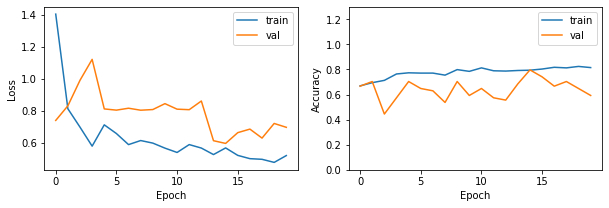

Fold 2 is running . . .


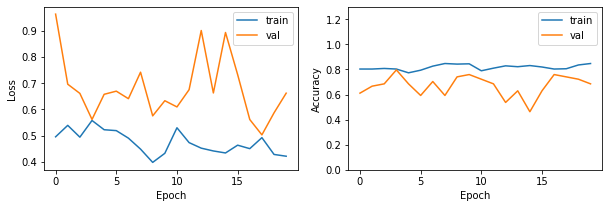

Fold 3 is running . . .


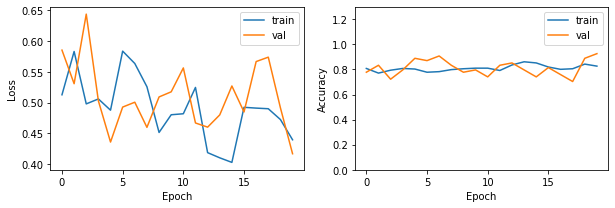

Fold 4 is running . . .


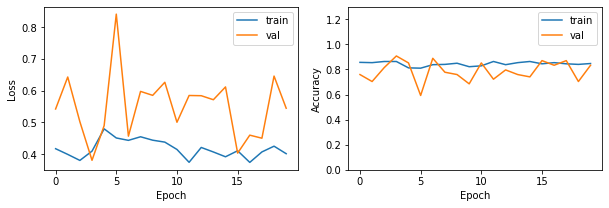

Fold 5 is running . . .


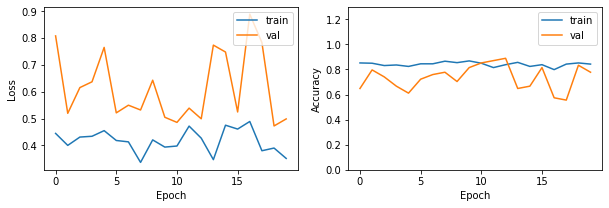

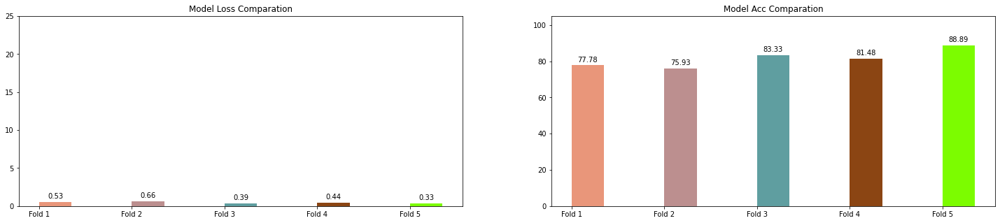

========== AVERAGE TRAIN OF Model2(0.5) ===========
Fold Accuracy Average: 81
Fold Loss Average: 0.47
Fold Accuracy Larges Value: 88.89
Fold Loss Larges Value: 0.66
Fold 1 is running . . .


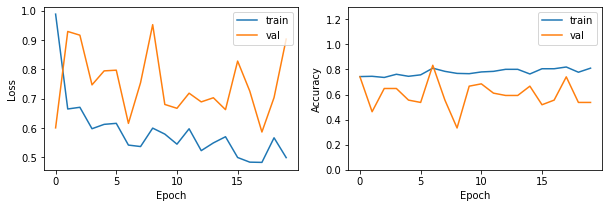

Fold 2 is running . . .


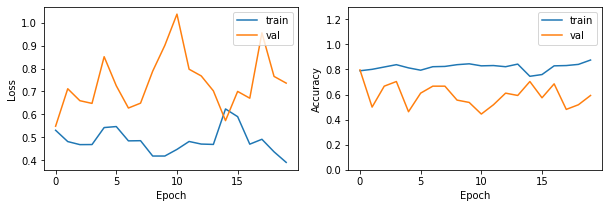

Fold 3 is running . . .


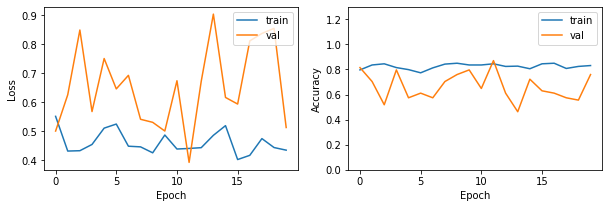

Fold 4 is running . . .


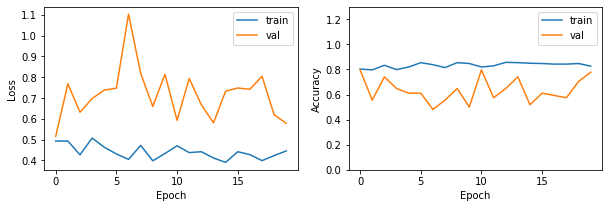

Fold 5 is running . . .


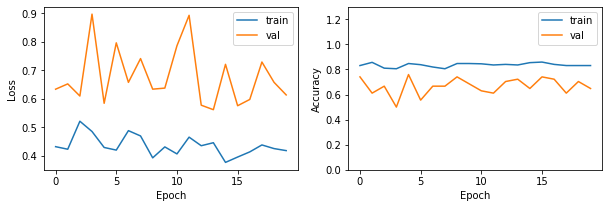

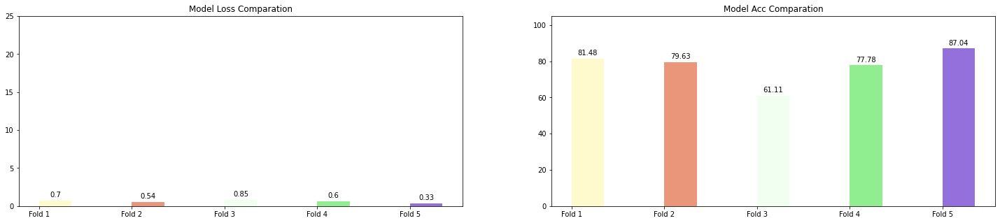

========== AVERAGE TRAIN OF Model3(0.5) ===========
Fold Accuracy Average: 77
Fold Loss Average: 0.6
Fold Accuracy Larges Value: 87.04
Fold Loss Larges Value: 0.85
Fold 1 is running . . .


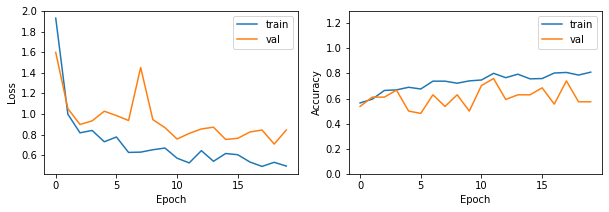

Fold 2 is running . . .


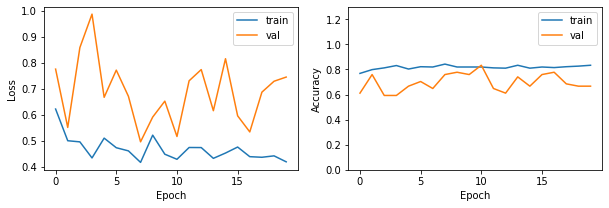

Fold 3 is running . . .


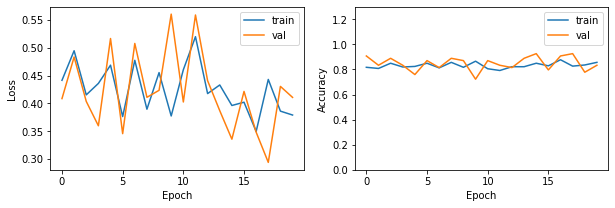

Fold 4 is running . . .


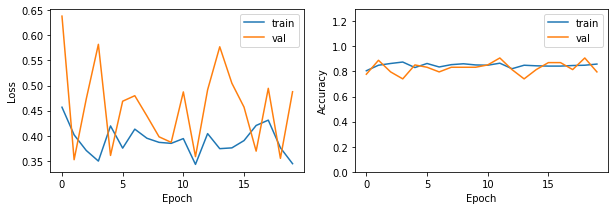

Fold 5 is running . . .


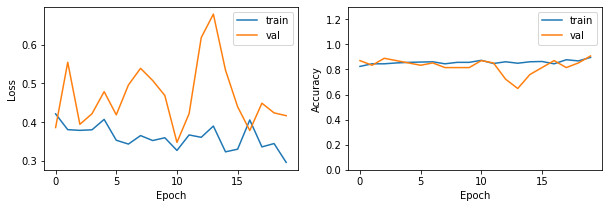

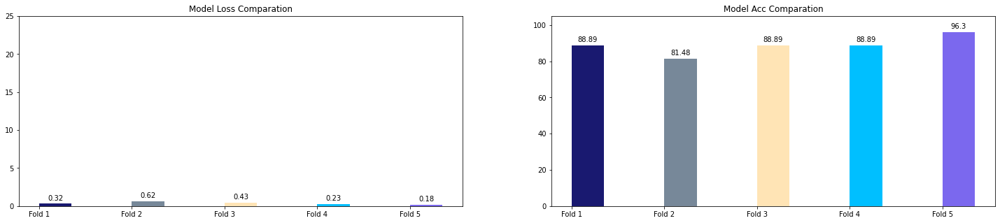

========== AVERAGE TRAIN OF Model1(0.25) ===========
Fold Accuracy Average: 89
Fold Loss Average: 0.36
Fold Accuracy Larges Value: 96.3
Fold Loss Larges Value: 0.62
Fold 1 is running . . .


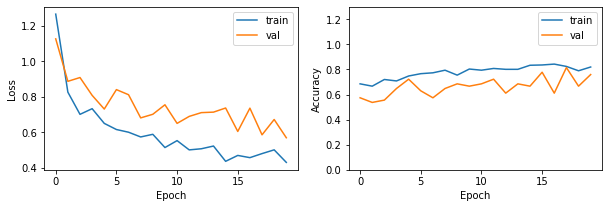

Fold 2 is running . . .


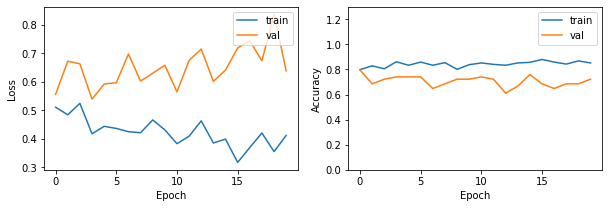

Fold 3 is running . . .


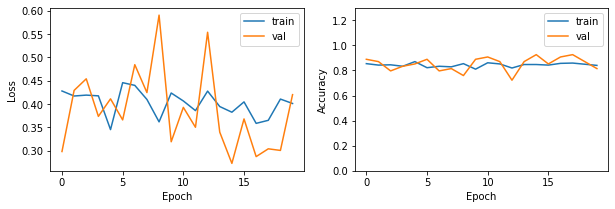

Fold 4 is running . . .


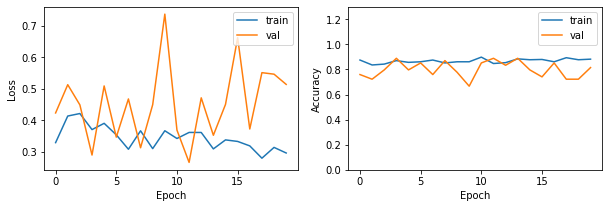

Fold 5 is running . . .


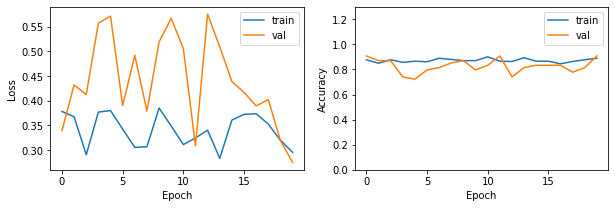

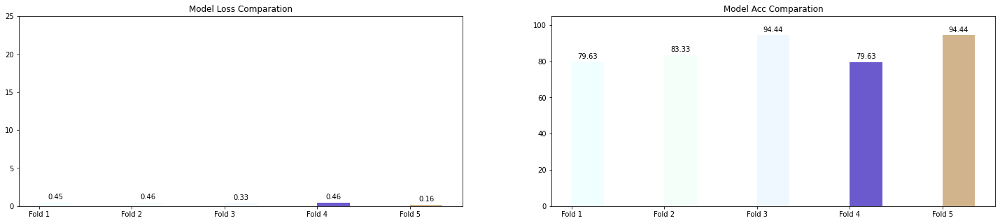

========== AVERAGE TRAIN OF Model2(0.25) ===========
Fold Accuracy Average: 86
Fold Loss Average: 0.37
Fold Accuracy Larges Value: 94.44
Fold Loss Larges Value: 0.46
Fold 1 is running . . .


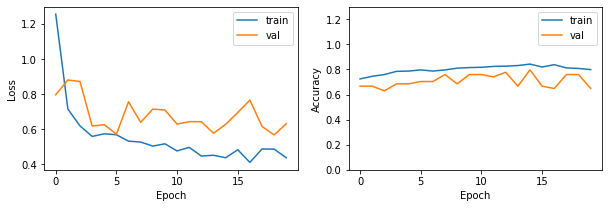

Fold 2 is running . . .


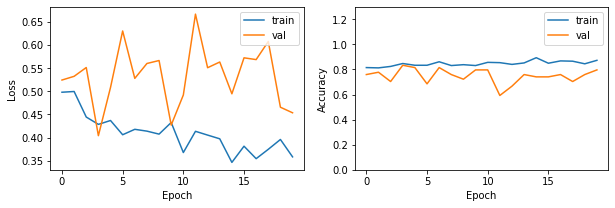

Fold 3 is running . . .


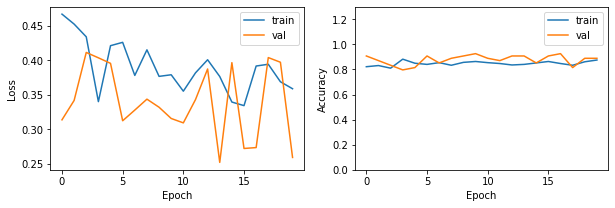

Fold 4 is running . . .


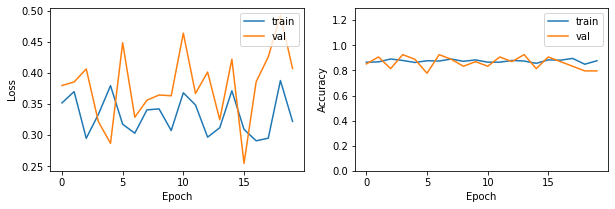

Fold 5 is running . . .


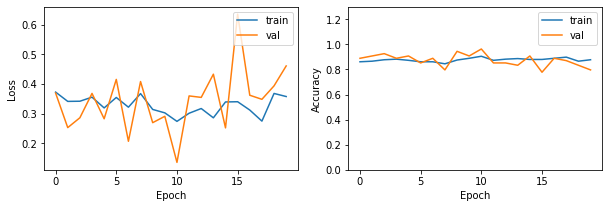

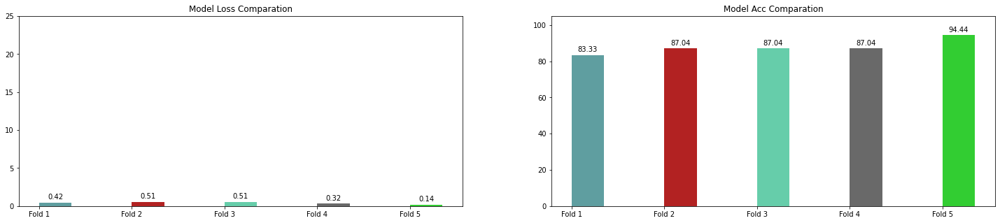

========== AVERAGE TRAIN OF Model3(0.25) ===========
Fold Accuracy Average: 88
Fold Loss Average: 0.38
Fold Accuracy Larges Value: 94.44
Fold Loss Larges Value: 0.51


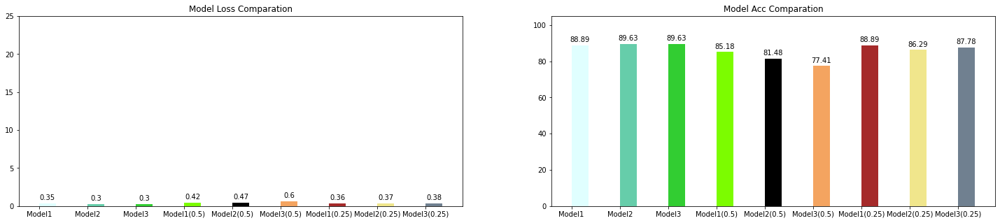

In [31]:
recap_losses = []
recap_accuracy = []
k_fold = 5
epoch_train = 20
batch_size_train = 32

for m in range(0, len(k_fold_models)):
  fold_title = []
  losses = []
  accs = []

  folds = list(StratifiedKFold(n_splits=k_fold, shuffle=True, random_state=1).split(x_dataset, y_dataset))

  for fold, (train_index, val_index) in enumerate(folds):
    x_train = x_dataset[train_index]
    y_train = y_dataset[train_index]
    x_val, x_test = split_list(x_dataset[val_index])
    y_val, y_test = split_list(y_dataset[val_index])

    data_train_augmanted = augmentation(x_train, y_train, aug_generator)
    data_validation_augmanted = augmentation(x_val, y_val, aug_generator)
    data_test_augmanted = augmentation(x_test, y_test, aug_generator)

    title = "%s%s" % ("Fold ", fold + 1)
    print(title, "is running . . .")
    fold_title.append(title)
    red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=1,verbose=0,factor=0.1)
    k_fold_models[m].compile(loss = loss_function, optimizer = optimizer_function, metrics=['accuracy'])
    history = k_fold_models[m].fit(data_train_augmanted, 
                      batch_size= batch_size_train,
                      epochs= epoch_train,
                      verbose= 0,
                      validation_data= data_validation_augmanted
                      #,callbacks=[red_lr]
                      )
    loss, acc = k_fold_models[m].evaluate(data_test_augmanted, verbose=0)
    losses.append(round(loss, 2))
    accs.append(round(acc*100, 2))
    model_result_checker(history)
  result_train_models(losses, accs, fold_title)
  print("========== AVERAGE TRAIN OF", k_fold_model_labels[m] ,"===========")
  print("Fold Accuracy Average:", round(average_result(accs)))
  print("Fold Loss Average:", round(average_result(losses), 2))
  print("Fold Accuracy Larges Value:", max(accs))
  print("Fold Loss Larges Value:", max(losses))
  print("==============================")
  recap_losses.append(round(average_result(losses), 2))
  recap_accuracy.append(round(average_result(accs), 2))

result_train_models(recap_losses, recap_accuracy, k_fold_model_labels)

#Orchid Detection

## Show data test result

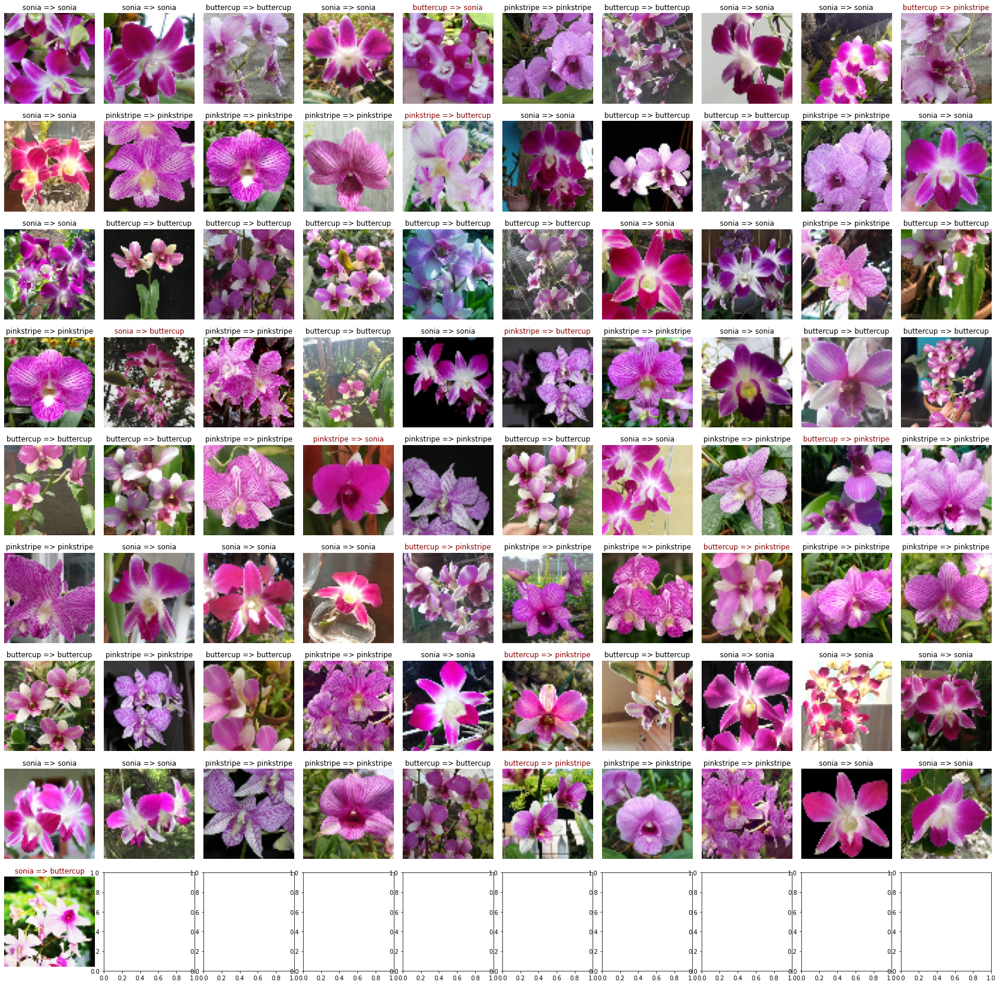

In [55]:
predictions = model6.predict(input_data_test_2)
yPred = np.argmax(predictions,axis=1)
show_image_predictions(input_data_test_2, input_data_test_label_2, yPred)

##Data test on Models


====================RESULT OF Model1 ========================
Total Data Test 81
Total Correct :  71
Total Incorrect :  10
--------------------------------------
Accuration :  87.65 %
--------------------------------------


              precision    recall  f1-score   support

           0       0.83      0.89      0.86        27
           1       0.88      0.85      0.87        27
           2       0.92      0.89      0.91        27

    accuracy                           0.88        81
   macro avg       0.88      0.88      0.88        81
weighted avg       0.88      0.88      0.88        81


====================RESULT OF Model2 ========================
Total Data Test 81
Total Correct :  70
Total Incorrect :  11
--------------------------------------
Accuration :  86.42 %
--------------------------------------


              precision    recall  f1-score   support

           0       0.82      0.85      0.84        27
           1       0.88      0.81      0.85        27
    

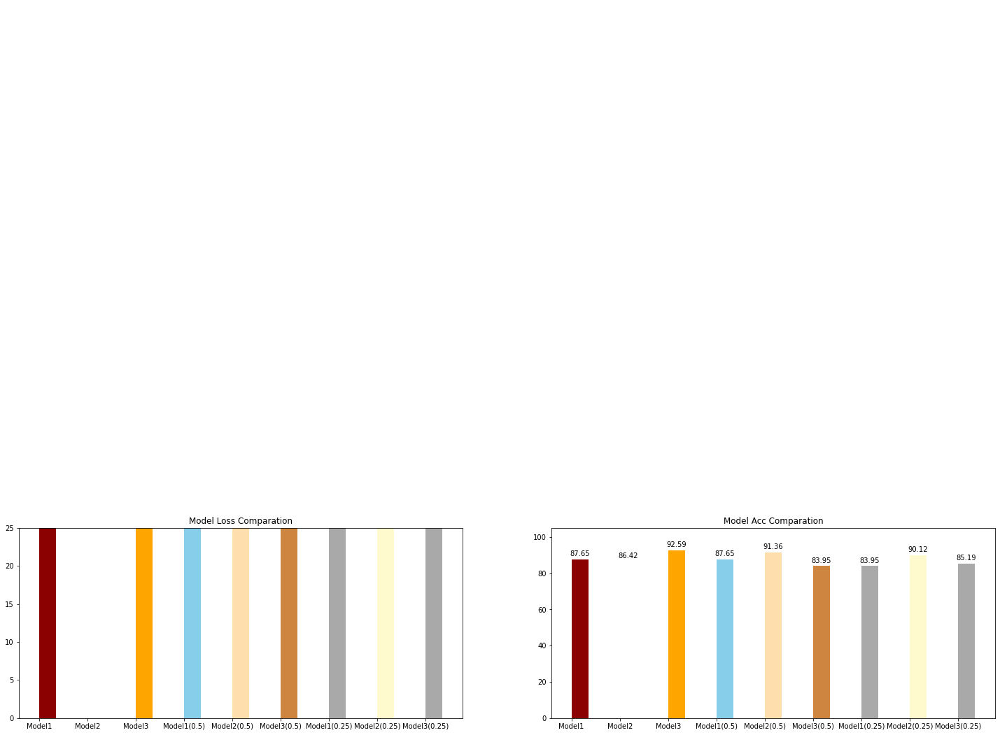

In [42]:
test_acc = []
for i in range(0, len(dummy_models)):
  print("\n====================RESULT OF", dummy_model_labels[i],"========================")
  test_acc.append(predict_multiple_data(dummy_models[i], input_data_test_2, input_data_test_label_2))

result_train_models(test_acc, test_acc, dummy_model_labels)


====================RESULT OF Model1 ========================
Total Data Test 81
Total Correct :  72
Total Incorrect :  9
--------------------------------------
Accuration :  88.89 %
--------------------------------------


              precision    recall  f1-score   support

           0       0.81      0.93      0.86        27
           1       0.96      0.85      0.90        27
           2       0.92      0.89      0.91        27

    accuracy                           0.89        81
   macro avg       0.90      0.89      0.89        81
weighted avg       0.90      0.89      0.89        81


====================RESULT OF Model2 ========================
Total Data Test 81
Total Correct :  72
Total Incorrect :  9
--------------------------------------
Accuration :  88.89 %
--------------------------------------


              precision    recall  f1-score   support

           0       0.81      0.93      0.86        27
           1       1.00      0.85      0.92        27
      

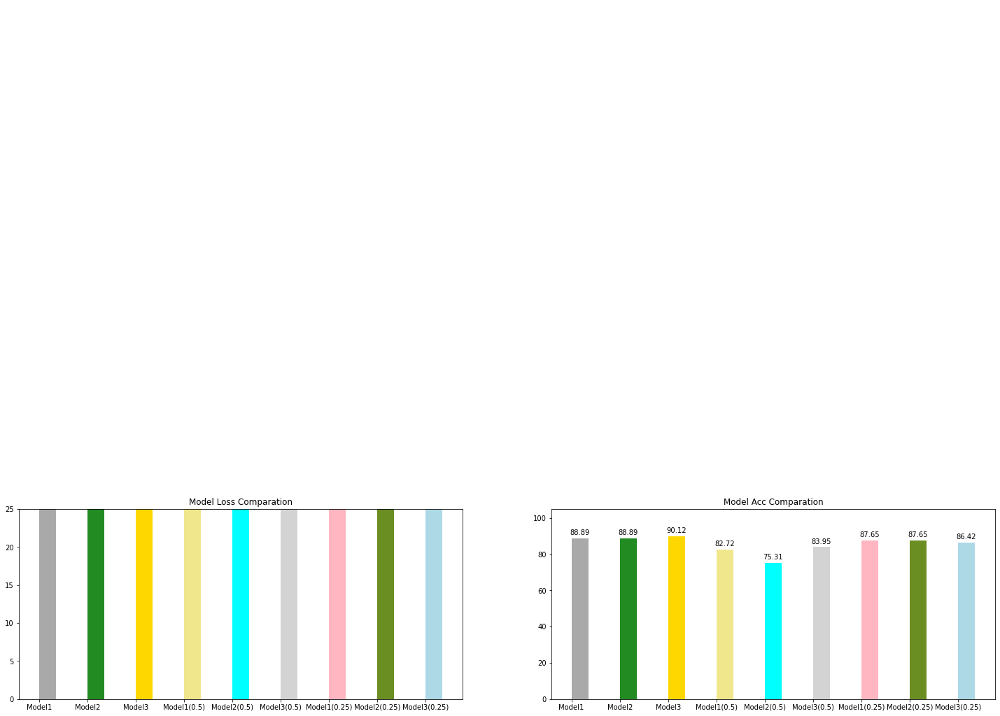

In [39]:
test_acc = []
for i in range(0, len(dummy_models)):
  print("\n====================RESULT OF", dummy_model_labels[i],"========================")
  test_acc.append(predict_multiple_data(dummy_models[i], input_data_test_2, input_data_test_label_2))

result_train_models(test_acc, test_acc, dummy_model_labels)

## Heatmap Prediction + Confusion Matrix (Tanpa Augmentasi)

              precision    recall  f1-score   support

   buttercup       0.83      0.89      0.86        27
  pinkstripe       0.88      0.85      0.87        27
       sonia       0.92      0.89      0.91        27

    accuracy                           0.88        81
   macro avg       0.88      0.88      0.88        81
weighted avg       0.88      0.88      0.88        81



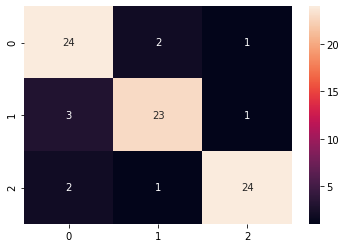

In [43]:
#Model 1
yPred1 = model1.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.82      0.85      0.84        27
  pinkstripe       0.88      0.81      0.85        27
       sonia       0.89      0.93      0.91        27

    accuracy                           0.86        81
   macro avg       0.86      0.86      0.86        81
weighted avg       0.86      0.86      0.86        81



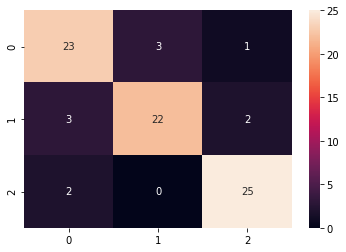

In [44]:
#Model 2
yPred1 = model2.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.86      0.93      0.89        27
  pinkstripe       0.96      0.93      0.94        27
       sonia       0.96      0.93      0.94        27

    accuracy                           0.93        81
   macro avg       0.93      0.93      0.93        81
weighted avg       0.93      0.93      0.93        81



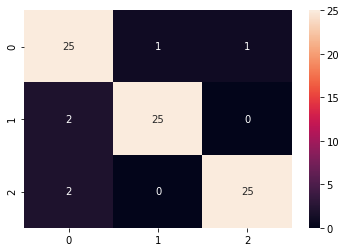

In [45]:
#Model 3
yPred1 = model3.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.83      0.89      0.86        27
  pinkstripe       0.92      0.81      0.86        27
       sonia       0.89      0.93      0.91        27

    accuracy                           0.88        81
   macro avg       0.88      0.88      0.88        81
weighted avg       0.88      0.88      0.88        81



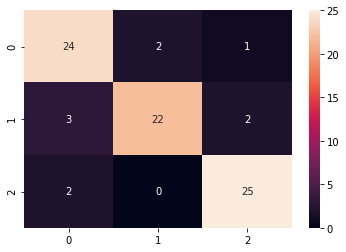

In [47]:
#Model 4
yPred1 = model4.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.89      0.89      0.89        27
  pinkstripe       0.93      0.93      0.93        27
       sonia       0.93      0.93      0.93        27

    accuracy                           0.91        81
   macro avg       0.91      0.91      0.91        81
weighted avg       0.91      0.91      0.91        81



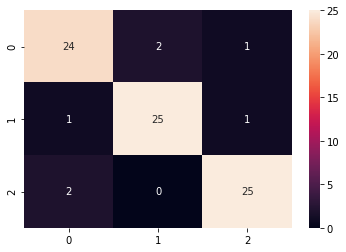

In [48]:
#Model 5
yPred1 = model5.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.89      0.59      0.71        27
  pinkstripe       0.73      1.00      0.84        27
       sonia       0.96      0.93      0.94        27

    accuracy                           0.84        81
   macro avg       0.86      0.84      0.83        81
weighted avg       0.86      0.84      0.83        81



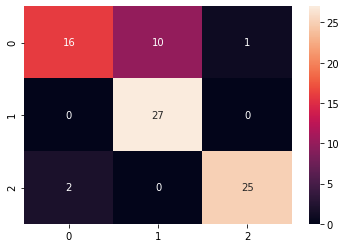

In [49]:
#Model 6
yPred1 = model6.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.88      0.78      0.82        27
  pinkstripe       0.79      0.85      0.82        27
       sonia       0.86      0.89      0.87        27

    accuracy                           0.84        81
   macro avg       0.84      0.84      0.84        81
weighted avg       0.84      0.84      0.84        81



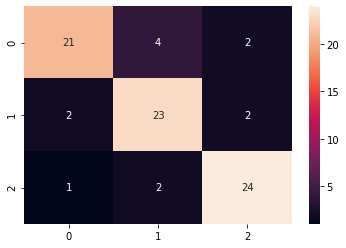

In [51]:
#Model 7
yPred1 = model7.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.88      0.85      0.87        27
  pinkstripe       0.89      0.93      0.91        27
       sonia       0.93      0.93      0.93        27

    accuracy                           0.90        81
   macro avg       0.90      0.90      0.90        81
weighted avg       0.90      0.90      0.90        81



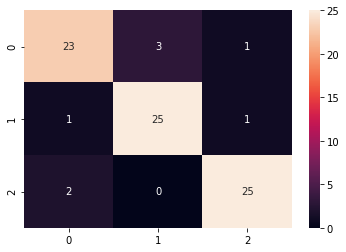

In [52]:
#Model 8
yPred1 = model8.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.83      0.74      0.78        27
  pinkstripe       0.80      0.89      0.84        27
       sonia       0.93      0.93      0.93        27

    accuracy                           0.85        81
   macro avg       0.85      0.85      0.85        81
weighted avg       0.85      0.85      0.85        81



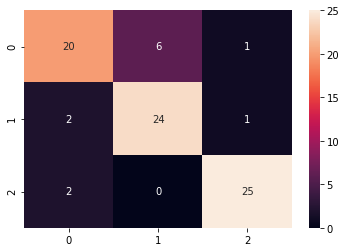

In [54]:
#Model 9
yPred1 = model9.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

##Heatmap Prediction + Confusion Matrix (Augmentation)

              precision    recall  f1-score   support

   buttercup       0.81      0.93      0.86        27
  pinkstripe       0.96      0.85      0.90        27
       sonia       0.92      0.89      0.91        27

    accuracy                           0.89        81
   macro avg       0.90      0.89      0.89        81
weighted avg       0.90      0.89      0.89        81



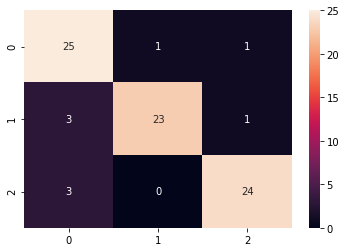

In [29]:
#Model 1
yPred1 = model1.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.81      0.93      0.86        27
  pinkstripe       1.00      0.85      0.92        27
       sonia       0.89      0.89      0.89        27

    accuracy                           0.89        81
   macro avg       0.90      0.89      0.89        81
weighted avg       0.90      0.89      0.89        81



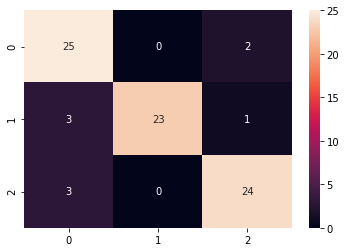

In [26]:
#Model 2
yPred1 = model2.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.86      0.93      0.89        27
  pinkstripe       1.00      0.85      0.92        27
       sonia       0.86      0.93      0.89        27

    accuracy                           0.90        81
   macro avg       0.91      0.90      0.90        81
weighted avg       0.91      0.90      0.90        81



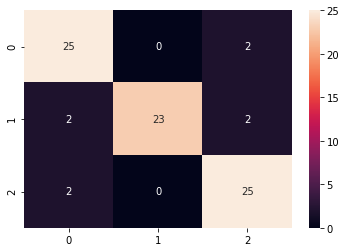

In [30]:
#Model 3
yPred1 = model3.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.90      0.67      0.77        27
  pinkstripe       0.72      0.96      0.83        27
       sonia       0.92      0.85      0.88        27

    accuracy                           0.83        81
   macro avg       0.85      0.83      0.83        81
weighted avg       0.85      0.83      0.83        81



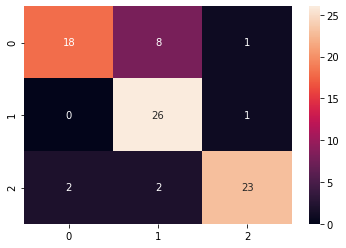

In [31]:
#Model 4
yPred1 = model4.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.81      0.48      0.60        27
  pinkstripe       0.63      0.96      0.76        27
       sonia       0.92      0.81      0.86        27

    accuracy                           0.75        81
   macro avg       0.79      0.75      0.74        81
weighted avg       0.79      0.75      0.74        81



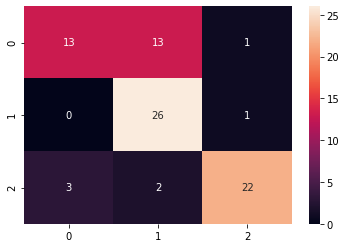

In [32]:
#Model 5
yPred1 = model5.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.86      0.67      0.75        27
  pinkstripe       0.76      0.93      0.83        27
       sonia       0.93      0.93      0.93        27

    accuracy                           0.84        81
   macro avg       0.85      0.84      0.84        81
weighted avg       0.85      0.84      0.84        81



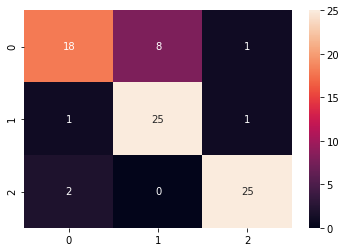

In [33]:
#Model 6
yPred1 = model6.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.85      0.85      0.85        27
  pinkstripe       0.88      0.85      0.87        27
       sonia       0.89      0.93      0.91        27

    accuracy                           0.88        81
   macro avg       0.88      0.88      0.88        81
weighted avg       0.88      0.88      0.88        81



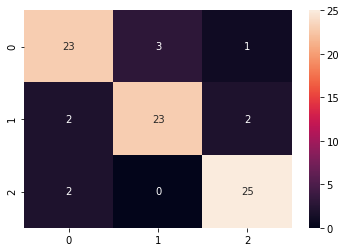

In [34]:
#Model 7
yPred1 = model7.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.91      0.78      0.84        27
  pinkstripe       0.81      0.96      0.88        27
       sonia       0.92      0.89      0.91        27

    accuracy                           0.88        81
   macro avg       0.88      0.88      0.88        81
weighted avg       0.88      0.88      0.88        81



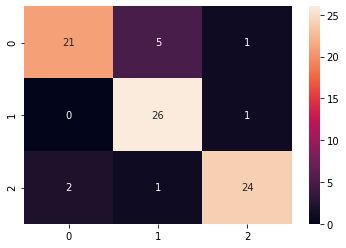

In [36]:
#Model 8
yPred1 = model8.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')

              precision    recall  f1-score   support

   buttercup       0.74      0.96      0.84        27
  pinkstripe       1.00      0.81      0.90        27
       sonia       0.92      0.81      0.86        27

    accuracy                           0.86        81
   macro avg       0.89      0.86      0.87        81
weighted avg       0.89      0.86      0.87        81



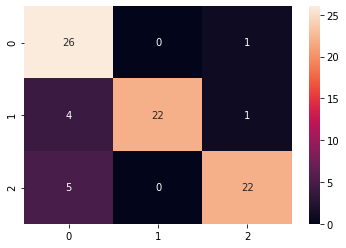

In [37]:
#Model 9
yPred1 = model9.predict(input_data_test_2)
yPred2 = np.argmax(yPred1,axis=1)
cm = confusion_matrix(input_data_test_label_2, yPred2)
print(classification_report(input_data_test_label_2, yPred2, target_names=categories))
sb.heatmap(cm, annot=True, fmt='d')